Please click for project overview


[Health Nutrition and Population Statistics](https://github.com/mozkemah/Health-Nutrition-Population/blob/master/Mehmet%20Ozkemah%20Capstone%202%20Project%20Overview.docx)

by Mehmet Ozkemah

Thinkful Data Science Flex Program

July 20



In [ ]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

import statsmodels.api as sm
import statsmodels.stats.api as sms
import statsmodels.formula.api as smf
from statsmodels.tsa.stattools import acf

from sqlalchemy import create_engine

from sklearn import linear_model

from scipy.stats import jarque_bera
from scipy.stats import normaltest
from scipy.stats import bartlett
from scipy.stats import levene

import warnings
warnings.filterwarnings('ignore')

# Display preferences.
%matplotlib inline
pd.options.display.float_format = '{:.3f}'.format

import warnings
warnings.filterwarnings(action="ignore")

In [ ]:
health_df = pd.read_csv("https://raw.githubusercontent.com/mozkemah/Health-Nutrition-Population/master/health.csv")

Let's see what my data looks like.

In [ ]:
health_df.head()

,Year,Year Code,Country Name,Country Code,"Age at first marriage, male [SP.DYN.SMAM.MA]","Age at first marriage, female [SP.DYN.SMAM.FE]","Cause of death, by injury (% of total) [SH.DTH.INJR.ZS]","Cause of death, by communicable diseases and maternal, prenatal and nutrition conditions (% of total) [SH.DTH.COMM.ZS]","Death rate, crude (per 1,000 people) [SP.DYN.CDRT.IN]",Diabetes prevalence (% of population ages 20 to 79) [SH.STA.DIAB.ZS],Exclusive breastfeeding (% of children under 6 months) [SH.STA.BFED.ZS],"Immunization, BCG (% of one-year-old children) [SH.IMM.IBCG]","Immunization, measles (% of children ages 12-23 months) [SH.IMM.MEAS]","Immunization, DPT (% of children ages 12-23 months) [SH.IMM.IDPT]","Labor force, total [SL.TLF.TOTL.IN]","Life expectancy at birth, female (years) [SP.DYN.LE00.FE.IN]","Life expectancy at birth, male (years) [SP.DYN.LE00.MA.IN]","Life expectancy at birth, total (years) [SP.DYN.LE00.IN]","Literacy rate, adult total (% of people ages 15 and above) [SE.ADT.LITR.ZS]","Mortality rate, infant (per 1,000 live births) [SP.DYN.IMRT.IN]",Net migration [SM.POP.NETM],"Number of surgical procedures (per 100,000 population) [SH.SGR.PROC.P5]",Number of people who are undernourished [SN.ITK.DEFC],"Physicians (per 1,000 people) [SH.MED.PHYS.ZS]","Population, total [SP.POP.TOTL]","Suicide mortality rate (per 100,000 population) [SH.STA.SUIC.P5]","Total alcohol consumption per capita (liters of pure alcohol, projected estimates, 15+ years of age) [SH.ALC.PCAP.LI]","Unemployment, total (% of total labor force) [SL.UEM.TOTL.ZS]",Rural population (% of total population) [SP.RUR.TOTL.ZS],Urban population (% of total population) [SP.URB.TOTL.IN.ZS],Current health expenditure (% of GDP) [SH.XPD.CHEX.GD.ZS],"Birth rate, crude (per 1,000 people) [SP.DYN.CBRT.IN]",Diarrhea treatment (% of children under 5 receiving oral rehydration and continued feeding) [SH.STA.ORCF.ZS],Domestic general government health expenditure (% of general government expenditure) [SH.XPD.GHED.GE.ZS],"Fertility rate, total (births per woman) [SP.DYN.TFRT.IN]","Immunization, HepB3 (% of one-year-old children) [SH.IMM.HEPB]","Immunization, Hib3 (% of children ages 12-23 months) [SH.IMM.HIB3]","Immunization, Pol3 (% of one-year-old children) [SH.IMM.POL3]",Low-birthweight babies (% of births) [SH.STA.BRTW.ZS],"Malnutrition prevalence, weight for age (% of children under 5) [SH.STA.MALN.ZS]",...,"Mortality rate, adult, female (per 1,000 female adults) [SP.DYN.AMRT.FE]","Mortality rate, infant, female (per 1,000 live births) [SP.DYN.IMRT.FE.IN]","Mortality rate, infant, male (per 1,000 live births) [SP.DYN.IMRT.MA.IN]",Number of infant deaths [SH.DTH.IMRT],Number of maternal deaths [SH.MMR.DTHS],Number of neonatal deaths [SH.DTH.NMRT],Number of people pushed below the $1.90 ($ 2011 PPP) poverty line by out-of-pocket health care expenditure [SH.UHC.NOP1.TO],Number of people pushed below the $3.20 ($ 2011 PPP) poverty line by out-of-pocket health care expenditure [SH.UHC.NOP2.TO],Number of people spending more than 25% of household consumption or income on out-of-pocket health care expenditure [SH.UHC.OOPC.25.TO],Number of under-five deaths [SH.DTH.MORT],"Nurses and midwives (per 1,000 people) [SH.MED.NUMW.P3]",Out-of-pocket expenditure per capita (current US$) [SH.XPD.OOPC.PC.CD],People using at least basic drinking water services (% of population) [SH.H2O.BASW.ZS],People using at least basic sanitation services (% of population) [SH.STA.BASS.ZS],People using safely managed drinking water services (% of population) [SH.H2O.SMDW.ZS],People with basic handwashing facilities including soap and water (% of population) [SH.STA.HYGN.ZS],Population ages 0-14 (% of total population) [SP.POP.0014.TO.ZS],Population ages 15-64 (% of total population) [SP.POP.1564.TO.ZS],Population ages 65 and above (% of total population) [SP.POP.65UP.TO.ZS],"Prevalence of HIV, total (% of population ages 15-49) [SH.DYN.AIDS.ZS]",Prevalence of overweight (% of adults) [SH.STA.

In [ ]:
health_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2305 entries, 0 to 2304
Data columns (total 88 columns):
 #   Column                                                                                                                                   Non-Null Count  Dtype 
---  ------                                                                                                                                   --------------  ----- 
 0   Year                                                                                                                                     2302 non-null   object
 1   Year Code                                                                                                                                2300 non-null   object
 2   Country Name                                                                                                                             2300 non-null   object
 3   Country Code                                                   

Let's list all unique values

In [ ]:
health_df.nunique().sort_values(ascending=False)

Population, total [SP.POP.TOTL]                                                                                                            2054
Urban population growth (annual %) [SP.URB.GROW]                                                                                           2037
Labor force, total [SL.TLF.TOTL.IN]                                                                                                        1982
Rural population growth (annual %) [SP.RUR.TOTL.ZG]                                                                                        1945
Urban population (% of total population) [SP.URB.TOTL.IN.ZS]                                                                               1927
                                                                                                                                           ... 
Number of people pushed below the $1.90 ($ 2011 PPP) poverty line by out-of-pocket health care expenditure [SH.UHC.NOP1.TO]             

To see how many unique country in my dataset;

In [ ]:
health_df['Country Name'].nunique()

230

**-DATA CLEANING-**

Handling with Messy Column Names

Column names look messy. I want to make them shorter and look better.

In [ ]:
health_df.columns = health_df.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('(', '').str.replace(')', '')

In [ ]:
health_df.head()

,year,year_code,country_name,country_code,"age_at_first_marriage,_male_[sp.dyn.smam.ma]","age_at_first_marriage,_female_[sp.dyn.smam.fe]","cause_of_death,_by_injury_%_of_total_[sh.dth.injr.zs]","cause_of_death,_by_communicable_diseases_and_maternal,_prenatal_and_nutrition_conditions_%_of_total_[sh.dth.comm.zs]","death_rate,_crude_per_1,000_people_[sp.dyn.cdrt.in]",diabetes_prevalence_%_of_population_ages_20_to_79_[sh.sta.diab.zs],exclusive_breastfeeding_%_of_children_under_6_months_[sh.sta.bfed.zs],"immunization,_bcg_%_of_one-year-old_children_[sh.imm.ibcg]","immunization,_measles_%_of_children_ages_12-23_months_[sh.imm.meas]","immunization,_dpt_%_of_children_ages_12-23_months_[sh.imm.idpt]","labor_force,_total_[sl.tlf.totl.in]","life_expectancy_at_birth,_female_years_[sp.dyn.le00.fe.in]","life_expectancy_at_birth,_male_years_[sp.dyn.le00.ma.in]","life_expectancy_at_birth,_total_years_[sp.dyn.le00.in]","literacy_rate,_adult_total_%_of_people_ages_15_and_above_[se.adt.litr.zs]","mortality_rate,_infant_per_1,000_live_births_[sp.dyn.imrt.in]",net_migration_[sm.pop.netm],"number_of_surgical_procedures_per_100,000_population_[sh.sgr.proc.p5]",number_of_people_who_are_undernourished_[sn.itk.defc],"physicians_per_1,000_people_[sh.med.phys.zs]","population,_total_[sp.pop.totl]","suicide_mortality_rate_per_100,000_population_[sh.sta.suic.p5]","total_alcohol_consumption_per_capita_liters_of_pure_alcohol,_projected_estimates,_15+_years_of_age_[sh.alc.pcap.li]","unemployment,_total_%_of_total_labor_force_[sl.uem.totl.zs]",rural_population_%_of_total_population_[sp.rur.totl.zs],urban_population_%_of_total_population_[sp.urb.totl.in.zs],current_health_expenditure_%_of_gdp_[sh.xpd.chex.gd.zs],"birth_rate,_crude_per_1,000_people_[sp.dyn.cbrt.in]",diarrhea_treatment_%_of_children_under_5_receiving_oral_rehydration_and_continued_feeding_[sh.sta.orcf.zs],domestic_general_government_health_expenditure_%_of_general_government_expenditure_[sh.xpd.ghed.ge.zs],"fertility_rate,_total_births_per_woman_[sp.dyn.tfrt.in]","immunization,_hepb3_%_of_one-year-old_children_[sh.imm.hepb]","immunization,_hib3_%_of_children_ages_12-23_months_[sh.imm.hib3]","immunization,_pol3_%_of_one-year-old_children_[sh.imm.pol3]",low-birthweight_babies_%_of_births_[sh.sta.brtw.zs],"malnutrition_prevalence,_weight_for_age_%_of_children_under_5_[sh.sta.maln.zs]",...,"mortality_rate,_adult,_female_per_1,000_female_adults_[sp.dyn.amrt.fe]","mortality_rate,_infant,_female_per_1,000_live_births_[sp.dyn.imrt.fe.in]","mortality_rate,_infant,_male_per_1,000_live_births_[sp.dyn.imrt.ma.in]",number_of_infant_deaths_[sh.dth.imrt],number_of_maternal_deaths_[sh.mmr.dths],number_of_neonatal_deaths_[sh.dth.nmrt],number_of_people_pushed_below_the_$1.90_$_2011_ppp_poverty_line_by_out-of-pocket_health_care_expenditure_[sh.uhc.nop1.to],number_of_people_pushed_below_the_$3.20_$_2011_ppp_poverty_line_by_out-of-pocket_health_care_expenditure_[sh.uhc.nop2.to],number_of_people_spending_more_than_25%_of_household_consumption_or_income_on_out-of-pocket_health_care_expenditure_[sh.uhc.oopc.25.to],number_of_under-five_deaths_[sh.dth.mort],"nurses_and_midwives_per_1,000_people_[sh.med.numw.p3]",out-of-pocket_expenditure_per_capita_current_us$_[sh.xpd.oopc.pc.cd],people_using_at_least_basic_drinking_water_services_%_of_population_[sh.h2o.basw.zs],people_using_at_least_basic_sanitation_services_%_of_population_[sh.sta.bass.zs],people_using_safely_managed_drinking_water_services_%_of_population_[sh.h2o.smdw.zs],people_with_basic_handwashing_facilities_including_soap_and_water_%_of_population_[sh.sta.hygn.zs],population_ages_0-14_%_of_total_population_[sp.pop.0014.to.zs],population_ages_15-64_%_of_total_population_[sp.pop.1564.to.zs],population_ages_65_and_above_%_of_total_population_[sp.pop.65up.to.zs],"prevalence_of_hiv,_total_%_of_population_ages_15-49_[sh.dyn.aids.zs]",prevalence_of_overweight_%_of_adults_[sh.sta.owad.zs],prevalence_of_overweight_%_of_children_under_5_[sh.sta.owgh.zs],prevalence_of_under

Looks better but not enough yet. They still look very long. Let's make them shorter. I take a unique abbreviation at the end of the column names as a new column name. 

In [ ]:
health_df.columns = health_df.columns.str[-19:]

In [ ]:
health_df.head()

,year,year_code,country_name,country_code,le_[sp.dyn.smam.ma],le_[sp.dyn.smam.fe],al_[sh.dth.injr.zs],al_[sh.dth.comm.zs],le_[sp.dyn.cdrt.in],79_[sh.sta.diab.zs],hs_[sh.sta.bfed.zs],ldren_[sh.imm.ibcg],onths_[sh.imm.meas],onths_[sh.imm.idpt],al_[sl.tlf.totl.in],[sp.dyn.le00.fe.in],[sp.dyn.le00.ma.in],rs_[sp.dyn.le00.in],ve_[se.adt.litr.zs],hs_[sp.dyn.imrt.in],ation_[sm.pop.netm],on_[sh.sgr.proc.p5],ished_[sn.itk.defc],le_[sh.med.phys.zs],total_[sp.pop.totl],on_[sh.sta.suic.p5],ge_[sh.alc.pcap.li],ce_[sl.uem.totl.zs],on_[sp.rur.totl.zs],[sp.urb.totl.in.zs],[sh.xpd.chex.gd.zs],le_[sp.dyn.cbrt.in],ng_[sh.sta.orcf.zs],[sh.xpd.ghed.ge.zs],an_[sp.dyn.tfrt.in],ldren_[sh.imm.hepb],onths_[sh.imm.hib3],ldren_[sh.imm.pol3],hs_[sh.sta.brtw.zs],_5_[sh.sta.maln.zs],...,ts_[sp.dyn.amrt.fe],[sp.dyn.imrt.fe.in],[sp.dyn.imrt.ma.in],eaths_[sh.dth.imrt],eaths_[sh.mmr.dths],eaths_[sh.dth.nmrt],re_[sh.uhc.nop1.to],re_[sh.uhc.nop2.to],[sh.uhc.oopc.25.to],eaths_[sh.dth.mort],le_[sh.med.numw.p3],[sh.xpd.oopc.pc.cd],on_[sh.h2o.basw.zs],on_[sh.sta.bass.zs],on_[sh.h2o.smdw.zs],on_[sh.sta.hygn.zs],[sp.pop.0014.to.zs],[sp.pop.1564.to.zs],[sp.pop.65up.to.zs],49_[sh.dyn.aids.zs],ts_[sh.sta.owad.zs],_5_[sh.sta.owgh.zs],on_[sn.itk.defc.zs],age_5_[sh.dyn.0514],[se.xpd.totl.gd.zs],.adt.1524.lt.fm.zs],%_net_[se.prm.nenr],%_net_[se.sec.nenr],gross_[se.ter.enrr],hs_[sp.pop.brth.mf],ts_[sh.prv.smok.ma],ts_[sh.prv.smok.fe],on_[sh.med.saop.p5],es_[sh.tbs.cure.zs],eople_[sh.tbs.mort],15-49_[sp.uwt.tfrt],ual_%_[sp.urb.grow],_%_[sp.rur.totl.zg],hs_[sn.itk.vita.zs],woman_[sp.dyn.wfrt]
0,2010,YR2010,Afghanistan,AFG,..,21.5,10.7,50.2,8.25,8.6,..,68,62,66,7173385,62.459,59.683,61.028,..,64.3,..,..,6400000,0.2365,29185507,5.1,0.2,11.48400021,76.263,23.737,8.569671214,39.829,..,2.255470678,5.977,66,66,66,..,..,...,228.971,60.4,68,74766,11000,55878,..,..,..,101882,..,36.01279831,48.35636006,34.17702772,..,37.55213,48.17814541,49.49372303,2.328131562,0.1,19.3,..,22.1,10,3.47945,..,..,..,..,1.06,..,..,..,86,43,..,3.630954363,2.472900396,96,..
1,2010,YR2010,Albania,ALB,..,..,5.3,3.3,6.841,4.5,..,99,99,99,1225905,79.302,74.145,76.562,..,11.9,..,..,200000,1.2347,2913021,7.8,7.9,14.08600044,47.837,52.163,..,12.001,..,15.21397829,1.66,99,99,99,4.6572967,..,...,55.689,10.8,12.9,422,7,207,..,..,..,474,4.0183,..,87.8112853,95.57169992,61.97765843,..,22.45508261,66.89951198,10.64540541,..,53.3,..,7.4,2.6,..,..,85.95611,..,44.54925,1.109,53.8,8.6,7.07,89,0.29,..,1.609373264,-2.743291493,..,..
2,2010,YR2010,Algeria,DZA,..,..,10.6,16.8,4.656,8.5,..,99,95,95,11075077,76.152,73.766,74.938,..,23.5,..,..,2300000,1.207,35977455,3.3,0.7,9.960000038,32.46,67.54,5.11717163,24.504,..,9.54484269,2.86,95,95,95,7.3330564,..,...,91.882,22,25,20342,1000,15001,..,..,..,23316,1.947,65.96736145,92.38946513,86.56042969,..,83.07031,27.28278029,67.26101388,5.456205838,0.1,57.4,..,6.3,4.3,..,..,97.23353,..,29.88943,1.05,28.8,1.5,..,89,8.5,..,2.867798457,-0.370770543,..,..
3,2010,YR2010,American Samoa,ASM,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,56079,..,..,..,12.406,87.594,..,18.7,..,..,..,..,..,..,..,..,...,..,..,..,..,..,..,..,..,..,..,..,..,99.23243189,62.52818676,12.50685483,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,100,0.67,..,-1.187900361,-0.244060131,..,..
4,2010,YR2010,Andorra,AND,..,..,..,..,2.8,6.6,..,..,99,99,..,..,..,..,..,3.9,..,..,..,4,84449,..,11.4,..,11.181,88.819,9.449671209,9.8,..,10.89236662,1.27,96,98,99,7.4442201,..,...,..,3.6,4.3,3,..,2,..,..,..,3,4.765,1705.856689,99.99999661,99.99999661,90.63999693,..,..,..,..,..,62.5,..,..,1.1,3.05742,..,..,..,..,..,39.7,29.5,..,86,0.78,..,-0.121248474,0.818848623,..,..


Now, remove "[]" from column names

In [ ]:
health_df.columns = health_df.columns.str.replace("[", "").str.replace("]", "").str.replace(".", "_")

In [ ]:
health_df.head()

,year,year_code,country_name,country_code,le_sp_dyn_smam_ma,le_sp_dyn_smam_fe,al_sh_dth_injr_zs,al_sh_dth_comm_zs,le_sp_dyn_cdrt_in,79_sh_sta_diab_zs,hs_sh_sta_bfed_zs,ldren_sh_imm_ibcg,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,ve_se_adt_litr_zs,hs_sp_dyn_imrt_in,ation_sm_pop_netm,on_sh_sgr_proc_p5,ished_sn_itk_defc,le_sh_med_phys_zs,total_sp_pop_totl,on_sh_sta_suic_p5,ge_sh_alc_pcap_li,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,sh_xpd_chex_gd_zs,le_sp_dyn_cbrt_in,ng_sh_sta_orcf_zs,sh_xpd_ghed_ge_zs,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,hs_sh_sta_brtw_zs,_5_sh_sta_maln_zs,...,ts_sp_dyn_amrt_fe,sp_dyn_imrt_fe_in,sp_dyn_imrt_ma_in,eaths_sh_dth_imrt,eaths_sh_mmr_dths,eaths_sh_dth_nmrt,re_sh_uhc_nop1_to,re_sh_uhc_nop2_to,sh_uhc_oopc_25_to,eaths_sh_dth_mort,le_sh_med_numw_p3,sh_xpd_oopc_pc_cd,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,on_sh_h2o_smdw_zs,on_sh_sta_hygn_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,49_sh_dyn_aids_zs,ts_sh_sta_owad_zs,_5_sh_sta_owgh_zs,on_sn_itk_defc_zs,age_5_sh_dyn_0514,se_xpd_totl_gd_zs,_adt_1524_lt_fm_zs,%_net_se_prm_nenr,%_net_se_sec_nenr,gross_se_ter_enrr,hs_sp_pop_brth_mf,ts_sh_prv_smok_ma,ts_sh_prv_smok_fe,on_sh_med_saop_p5,es_sh_tbs_cure_zs,eople_sh_tbs_mort,15-49_sp_uwt_tfrt,ual_%_sp_urb_grow,_%_sp_rur_totl_zg,hs_sn_itk_vita_zs,woman_sp_dyn_wfrt
0,2010,YR2010,Afghanistan,AFG,..,21.5,10.7,50.2,8.25,8.6,..,68,62,66,7173385,62.459,59.683,61.028,..,64.3,..,..,6400000,0.2365,29185507,5.1,0.2,11.48400021,76.263,23.737,8.569671214,39.829,..,2.255470678,5.977,66,66,66,..,..,...,228.971,60.4,68,74766,11000,55878,..,..,..,101882,..,36.01279831,48.35636006,34.17702772,..,37.55213,48.17814541,49.49372303,2.328131562,0.1,19.3,..,22.1,10,3.47945,..,..,..,..,1.06,..,..,..,86,43,..,3.630954363,2.472900396,96,..
1,2010,YR2010,Albania,ALB,..,..,5.3,3.3,6.841,4.5,..,99,99,99,1225905,79.302,74.145,76.562,..,11.9,..,..,200000,1.2347,2913021,7.8,7.9,14.08600044,47.837,52.163,..,12.001,..,15.21397829,1.66,99,99,99,4.6572967,..,...,55.689,10.8,12.9,422,7,207,..,..,..,474,4.0183,..,87.8112853,95.57169992,61.97765843,..,22.45508261,66.89951198,10.64540541,..,53.3,..,7.4,2.6,..,..,85.95611,..,44.54925,1.109,53.8,8.6,7.07,89,0.29,..,1.609373264,-2.743291493,..,..
2,2010,YR2010,Algeria,DZA,..,..,10.6,16.8,4.656,8.5,..,99,95,95,11075077,76.152,73.766,74.938,..,23.5,..,..,2300000,1.207,35977455,3.3,0.7,9.960000038,32.46,67.54,5.11717163,24.504,..,9.54484269,2.86,95,95,95,7.3330564,..,...,91.882,22,25,20342,1000,15001,..,..,..,23316,1.947,65.96736145,92.38946513,86.56042969,..,83.07031,27.28278029,67.26101388,5.456205838,0.1,57.4,..,6.3,4.3,..,..,97.23353,..,29.88943,1.05,28.8,1.5,..,89,8.5,..,2.867798457,-0.370770543,..,..
3,2010,YR2010,American Samoa,ASM,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,56079,..,..,..,12.406,87.594,..,18.7,..,..,..,..,..,..,..,..,...,..,..,..,..,..,..,..,..,..,..,..,..,99.23243189,62.52818676,12.50685483,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,..,100,0.67,..,-1.187900361,-0.244060131,..,..
4,2010,YR2010,Andorra,AND,..,..,..,..,2.8,6.6,..,..,99,99,..,..,..,..,..,3.9,..,..,..,4,84449,..,11.4,..,11.181,88.819,9.449671209,9.8,..,10.89236662,1.27,96,98,99,7.4442201,..,...,..,3.6,4.3,3,..,2,..,..,..,3,4.765,1705.856689,99.99999661,99.99999661,90.63999693,..,..,..,..,..,62.5,..,..,1.1,3.05742,..,..,..,..,..,39.7,29.5,..,86,0.78,..,-0.121248474,0.818848623,..,..


Looks much more better now.

**Null Values**

To see the percentage of null values for each column;

In [ ]:
health_df.isnull().sum()*100/health_df.isnull().count()

year                0.130
year_code           0.217
country_name        0.217
country_code        0.217
le_sp_dyn_smam_ma   0.217
                     ... 
15-49_sp_uwt_tfrt   0.217
ual_%_sp_urb_grow   0.217
_%_sp_rur_totl_zg   0.217
hs_sn_itk_vita_zs   0.217
woman_sp_dyn_wfrt   0.217
Length: 88, dtype: float64

Actually we have too much null values but as there is a problem on dataset we can't see them. Because they look as '..' Now I will convert them to ' '. So we will be able to see null values. Before that we have to deal with another problem. Our values look as object but actually almost everyhting should be float. year should be date, year_code, country_name and country_code should be string.


**Converting Data to Right Type:**

In [ ]:
cols = health_df.columns.drop(['year', 'year_code', 'country_name', 'country_code'])

I excluded those 4 non-float cells from my dataset and made the rest numeric.

In [ ]:
health_df[cols] = health_df[cols].apply(pd.to_numeric, errors='coerce')

In [ ]:
health_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2305 entries, 0 to 2304
Data columns (total 88 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   year                2302 non-null   object 
 1   year_code           2300 non-null   object 
 2   country_name        2300 non-null   object 
 3   country_code        2300 non-null   object 
 4   le_sp_dyn_smam_ma   217 non-null    float64
 5   le_sp_dyn_smam_fe   248 non-null    float64
 6   al_sh_dth_injr_zs   588 non-null    float64
 7   al_sh_dth_comm_zs   588 non-null    float64
 8   le_sp_dyn_cdrt_in   1965 non-null   float64
 9   79_sh_sta_diab_zs   441 non-null    float64
 10  hs_sh_sta_bfed_zs   241 non-null    float64
 11  ldren_sh_imm_ibcg   1493 non-null   float64
 12  onths_sh_imm_meas   1844 non-null   float64
 13  onths_sh_imm_idpt   1844 non-null   float64
 14  al_sl_tlf_totl_in   1992 non-null   float64
 15  sp_dyn_le00_fe_in   1919 non-null   float64
 16  sp_dyn

Now I have correct data types.(4 object and 84 float)

When I return object data to float, ".." also returned to nan. So no need to deal with that anymore.

In [ ]:
health_df.head()

,year,year_code,country_name,country_code,le_sp_dyn_smam_ma,le_sp_dyn_smam_fe,al_sh_dth_injr_zs,al_sh_dth_comm_zs,le_sp_dyn_cdrt_in,79_sh_sta_diab_zs,hs_sh_sta_bfed_zs,ldren_sh_imm_ibcg,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,ve_se_adt_litr_zs,hs_sp_dyn_imrt_in,ation_sm_pop_netm,on_sh_sgr_proc_p5,ished_sn_itk_defc,le_sh_med_phys_zs,total_sp_pop_totl,on_sh_sta_suic_p5,ge_sh_alc_pcap_li,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,sh_xpd_chex_gd_zs,le_sp_dyn_cbrt_in,ng_sh_sta_orcf_zs,sh_xpd_ghed_ge_zs,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,hs_sh_sta_brtw_zs,_5_sh_sta_maln_zs,...,ts_sp_dyn_amrt_fe,sp_dyn_imrt_fe_in,sp_dyn_imrt_ma_in,eaths_sh_dth_imrt,eaths_sh_mmr_dths,eaths_sh_dth_nmrt,re_sh_uhc_nop1_to,re_sh_uhc_nop2_to,sh_uhc_oopc_25_to,eaths_sh_dth_mort,le_sh_med_numw_p3,sh_xpd_oopc_pc_cd,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,on_sh_h2o_smdw_zs,on_sh_sta_hygn_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,49_sh_dyn_aids_zs,ts_sh_sta_owad_zs,_5_sh_sta_owgh_zs,on_sn_itk_defc_zs,age_5_sh_dyn_0514,se_xpd_totl_gd_zs,_adt_1524_lt_fm_zs,%_net_se_prm_nenr,%_net_se_sec_nenr,gross_se_ter_enrr,hs_sp_pop_brth_mf,ts_sh_prv_smok_ma,ts_sh_prv_smok_fe,on_sh_med_saop_p5,es_sh_tbs_cure_zs,eople_sh_tbs_mort,15-49_sp_uwt_tfrt,ual_%_sp_urb_grow,_%_sp_rur_totl_zg,hs_sn_itk_vita_zs,woman_sp_dyn_wfrt
0,2010,YR2010,Afghanistan,AFG,nan,21.500,10.700,50.200,8.250,8.600,nan,68.000,62.000,66.000,7173385.000,62.459,59.683,61.028,nan,64.300,nan,nan,6400000.000,0.236,29185507.000,5.100,0.200,11.484,76.263,23.737,8.570,39.829,nan,2.255,5.977,66.000,66.000,66.000,nan,nan,...,228.971,60.400,68.000,74766.000,11000.000,55878.000,nan,nan,nan,101882.000,nan,36.013,48.356,34.177,nan,37.552,48.178,49.494,2.328,0.100,19.300,nan,22.100,10.000,3.479,nan,nan,nan,nan,1.060,nan,nan,nan,86.000,43.000,nan,3.631,2.473,96.000,nan
1,2010,YR2010,Albania,ALB,nan,nan,5.300,3.300,6.841,4.500,nan,99.000,99.000,99.000,1225905.000,79.302,74.145,76.562,nan,11.900,nan,nan,200000.000,1.235,2913021.000,7.800,7.900,14.086,47.837,52.163,nan,12.001,nan,15.214,1.660,99.000,99.000,99.000,4.657,nan,...,55.689,10.800,12.900,422.000,7.000,207.000,nan,nan,nan,474.000,4.018,nan,87.811,95.572,61.978,nan,22.455,66.900,10.645,nan,53.300,nan,7.400,2.600,nan,nan,85.956,nan,44.549,1.109,53.800,8.600,7.070,89.000,0.290,nan,1.609,-2.743,nan,nan
2,2010,YR2010,Algeria,DZA,nan,nan,10.600,16.800,4.656,8.500,nan,99.000,95.000,95.000,11075077.000,76.152,73.766,74.938,nan,23.500,nan,nan,2300000.000,1.207,35977455.000,3.300,0.700,9.960,32.460,67.540,5.117,24.504,nan,9.545,2.860,95.000,95.000,95.000,7.333,nan,...,91.882,22.000,25.000,20342.000,1000.000,15001.000,nan,nan,nan,23316.000,1.947,65.967,92.389,86.560,nan,83.070,27.283,67.261,5.456,0.100,57.400,nan,6.300,4.300,nan,nan,97.234,nan,29.889,1.050,28.800,1.500,nan,89.000,8.500,nan,2.868,-0.371,nan,nan
3,2010,YR2010,American Samoa,ASM,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,56079.000,nan,nan,nan,12.406,87.594,nan,18.700,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,99.232,62.528,12.507,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,100.000,0.670,nan,-1.188,-0.244,nan,nan
4,2010,YR2010,Andorra,AND,nan,nan,nan,nan,2.800,6.600,nan,nan,99.000,99.000,nan,nan,nan,nan,nan,3.900,nan,nan,nan,4.000,84449.000,nan,11.400,nan,11.181,88.819,9.450,9.800,nan,10.892,1.270,96.000,98.000,99.000,7.444,nan,...,nan,3.600,4.300,3.000,nan,2.000,nan,nan,nan,3.000,4.765,1705.857,100.000,100.000,90.640,nan,nan,nan,nan,nan,62.500,nan,nan,1.100,3.057,nan,nan,nan,nan,nan,39.700,29.500,nan,86.000,0.780,nan,-0.121,0.819,nan,nan


I need a threshold percentage for missing values. I defined it as 30%.
To see the columns that have more than 30% values missing;

In [ ]:
missing_vals = (health_df.isnull().sum()/len(health_df)).sort_values(ascending=False)
missing_vals = missing_vals[missing_vals > 0.3]
missing_vals


re_sh_uhc_nop2_to    0.995
re_sh_uhc_nop1_to    0.995
sh_uhc_oopc_25_to    0.995
on_sh_sgr_proc_p5    0.970
woman_sp_dyn_wfrt    0.960
ng_sh_sta_orcf_zs    0.920
on_sh_sta_wash_p5    0.915
on_sh_sta_airp_p5    0.915
hs_sh_sta_mmrt_ne    0.908
le_sp_dyn_smam_ma    0.906
15-49_sp_uwt_tfrt    0.897
hs_sh_sta_bfed_zs    0.895
le_sp_dyn_smam_fe    0.892
on_sh_med_saop_p5    0.868
_5_sh_sta_owgh_zs    0.849
_5_sh_sta_maln_zs    0.849
le_sh_sta_traf_p5    0.832
ge_sh_alc_pcap_li    0.826
ation_sm_pop_netm    0.820
79_sh_sta_diab_zs    0.809
hs_sn_itk_vita_zs    0.778
_adt_1524_lt_fm_zs   0.777
ve_se_adt_litr_zs    0.774
al_sh_dth_injr_zs    0.745
on_sh_sta_pois_p5    0.745
al_sh_dth_comm_zs    0.745
on_sh_sta_suic_p5    0.745
_%_sh_dyn_ncom_zs    0.745
sp_dyn_imrt_fe_in    0.732
sp_dyn_imrt_ma_in    0.732
age_5_sh_dyn_0514    0.732
od_sh_mmr_wage_zs    0.728
on_sh_sta_hygn_zs    0.714
hs_sh_sta_brtw_zs    0.602
on_sh_h2o_smdw_zs    0.601
se_xpd_totl_gd_zs    0.556
le_sh_med_phys_zs    0.549
i

In [ ]:
missing_vals.count()

53

I have 53 columns that have more than 30% values missing.
Now I want to drop them. 
I will first define my threshold and then apply dropna

In [ ]:
thresh = len(health_df) * .7
health_df.dropna(thresh = thresh, axis = 1, inplace = True)


In [ ]:
health_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2305 entries, 0 to 2304
Data columns (total 35 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   year               2302 non-null   object 
 1   year_code          2300 non-null   object 
 2   country_name       2300 non-null   object 
 3   country_code       2300 non-null   object 
 4   le_sp_dyn_cdrt_in  1965 non-null   float64
 5   onths_sh_imm_meas  1844 non-null   float64
 6   onths_sh_imm_idpt  1844 non-null   float64
 7   al_sl_tlf_totl_in  1992 non-null   float64
 8   sp_dyn_le00_fe_in  1919 non-null   float64
 9   sp_dyn_le00_ma_in  1919 non-null   float64
 10  rs_sp_dyn_le00_in  1919 non-null   float64
 11  hs_sp_dyn_imrt_in  1854 non-null   float64
 12  total_sp_pop_totl  2063 non-null   float64
 13  ce_sl_uem_totl_zs  2000 non-null   float64
 14  on_sp_rur_totl_zs  2045 non-null   float64
 15  sp_urb_totl_in_zs  2045 non-null   float64
 16  le_sp_dyn_cbrt_in  1964 

I have dropped 53 columns and will move with 35 columns. I have 31 float and 4 object.

I can also drop country code and year code. I don't need them. Because I have 2 more similar columns which are year and country name.

In [ ]:
health_df.drop(['country_code', 'year_code'],axis=1,inplace=True)

In [ ]:
health_df.head()

,year,country_name,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
0,2010,Afghanistan,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
1,2010,Albania,6.841,99.000,99.000,1225905.000,79.302,74.145,76.562,11.900,2913021.000,14.086,47.837,52.163,12.001,1.660,99.000,99.000,99.000,106.184,55.689,422.000,207.000,474.000,87.811,95.572,22.455,66.900,10.645,1.109,0.290,1.609,-2.743
2,2010,Algeria,4.656,95.000,95.000,11075077.000,76.152,73.766,74.938,23.500,35977455.000,9.960,32.460,67.540,24.504,2.860,95.000,95.000,95.000,116.385,91.882,20342.000,15001.000,23316.000,92.389,86.560,27.283,67.261,5.456,1.050,8.500,2.868,-0.371
3,2010,American Samoa,nan,nan,nan,nan,nan,nan,nan,nan,56079.000,nan,12.406,87.594,18.700,nan,nan,nan,nan,nan,nan,nan,nan,nan,99.232,62.528,nan,nan,nan,nan,0.670,-1.188,-0.244
4,2010,Andorra,2.800,99.000,99.000,nan,nan,nan,nan,3.900,84449.000,nan,11.181,88.819,9.800,1.270,96.000,98.000,99.000,nan,nan,3.000,2.000,3.000,100.000,100.000,nan,nan,nan,nan,0.780,-0.121,0.819


To return float year to date time

In [ ]:
from datetime import datetime
import datetime

In [ ]:
health_df['year'].value_counts()

2017                                                              230
2018                                                              230
2014                                                              230
2011                                                              230
2013                                                              230
2019                                                              230
2015                                                              230
2010                                                              230
2012                                                              230
2016                                                              230
Data from database: Health Nutrition and Population Statistics      1
Last Updated: 05/19/2020                                            1
Name: year, dtype: int64

In [ ]:
health_df.tail()

,year,country_name,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
2300,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2301,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2302,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2303,Data from database: Health Nutrition and Popul...,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2304,Last Updated: 05/19/2020,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


All values at the last 2 rows are null. So it's better to remove those rows from my dataset.

In [ ]:
health_df = health_df.iloc[:-2]

In [ ]:
health_df.tail(10)

,year,country_name,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
2293,2019,Vietnam,nan,nan,nan,57364217.000,nan,nan,nan,nan,nan,2.013,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2294,2019,Virgin Islands (U.S.),nan,nan,nan,51981.000,nan,nan,nan,nan,nan,8.662,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2295,2019,West Bank and Gaza,nan,nan,nan,1261658.000,nan,nan,nan,nan,nan,26.169,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2296,2019,World,nan,nan,nan,3459586765.000,nan,nan,nan,nan,nan,5.395,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2297,2019,"Yemen, Rep.",nan,nan,nan,6734740.000,nan,nan,nan,nan,nan,12.910,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2298,2019,Zambia,nan,nan,nan,7401808.000,nan,nan,nan,nan,nan,11.425,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2299,2019,Zimbabwe,nan,nan,nan,7040147.000,nan,nan,nan,nan,nan,4.954,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2300,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2301,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2302,NaN,NaN,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


Again, last 3 columns have no values and need to be removed.

In [ ]:
health_df = health_df.iloc[:-3]

In [ ]:
health_df.tail()

,year,country_name,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
2295,2019,West Bank and Gaza,nan,nan,nan,1261658.000,nan,nan,nan,nan,nan,26.169,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2296,2019,World,nan,nan,nan,3459586765.000,nan,nan,nan,nan,nan,5.395,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2297,2019,"Yemen, Rep.",nan,nan,nan,6734740.000,nan,nan,nan,nan,nan,12.910,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2298,2019,Zambia,nan,nan,nan,7401808.000,nan,nan,nan,nan,nan,11.425,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
2299,2019,Zimbabwe,nan,nan,nan,7040147.000,nan,nan,nan,nan,nan,4.954,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan


Now it looks better. But it's much more better to see how many null values in each row.

In [ ]:
health_df.isnull().sum(axis=1)

0        0
1        0
2        0
3       22
4       11
        ..
2295    29
2296    29
2297    29
2298    29
2299    29
Length: 2300, dtype: int64

As you can see above, some rows (countries) have more than 20 null values. I have 35 variables and 20 of them null? It is too much. I think it's better to remove some countries from my dataset. Let's remove the countries who have more than 20 null values. In other words, I will keep the countries who have less than 15 null values. 

In [ ]:
health_df.dropna(thresh=15, how="any", inplace=True)

Let's check if it worked;

In [ ]:
health_df.isnull().sum(axis=1).sort_values(ascending=False)

712     18
348     18
1402    18
1268    18
1172    18
        ..
1138     0
1139     0
1140     0
1141     0
0        0
Length: 1973, dtype: int64

The number of rows and null values also decreased.

Now, it's time to convert type of year from float to date time.

In [ ]:
health_df['year'] = pd.to_datetime(health_df['year'])


In [ ]:
health_df.dtypes

year                 datetime64[ns]
country_name                 object
le_sp_dyn_cdrt_in           float64
onths_sh_imm_meas           float64
onths_sh_imm_idpt           float64
al_sl_tlf_totl_in           float64
sp_dyn_le00_fe_in           float64
sp_dyn_le00_ma_in           float64
rs_sp_dyn_le00_in           float64
hs_sp_dyn_imrt_in           float64
total_sp_pop_totl           float64
ce_sl_uem_totl_zs           float64
on_sp_rur_totl_zs           float64
sp_urb_totl_in_zs           float64
le_sp_dyn_cbrt_in           float64
an_sp_dyn_tfrt_in           float64
ldren_sh_imm_hepb           float64
onths_sh_imm_hib3           float64
ldren_sh_imm_pol3           float64
ts_sp_dyn_amrt_ma           float64
ts_sp_dyn_amrt_fe           float64
eaths_sh_dth_imrt           float64
eaths_sh_dth_nmrt           float64
eaths_sh_dth_mort           float64
on_sh_h2o_basw_zs           float64
on_sh_sta_bass_zs           float64
sp_pop_0014_to_zs           float64
sp_pop_1564_to_zs           

In [ ]:
health_df.head()

,year,country_name,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
0,2010-01-01,Afghanistan,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
1,2010-01-01,Albania,6.841,99.000,99.000,1225905.000,79.302,74.145,76.562,11.900,2913021.000,14.086,47.837,52.163,12.001,1.660,99.000,99.000,99.000,106.184,55.689,422.000,207.000,474.000,87.811,95.572,22.455,66.900,10.645,1.109,0.290,1.609,-2.743
2,2010-01-01,Algeria,4.656,95.000,95.000,11075077.000,76.152,73.766,74.938,23.500,35977455.000,9.960,32.460,67.540,24.504,2.860,95.000,95.000,95.000,116.385,91.882,20342.000,15001.000,23316.000,92.389,86.560,27.283,67.261,5.456,1.050,8.500,2.868,-0.371
4,2010-01-01,Andorra,2.800,99.000,99.000,nan,nan,nan,nan,3.900,84449.000,nan,11.181,88.819,9.800,1.270,96.000,98.000,99.000,nan,nan,3.000,2.000,3.000,100.000,100.000,nan,nan,nan,nan,0.780,-0.121,0.819
5,2010-01-01,Angola,11.680,62.000,52.000,9560441.000,58.033,52.848,55.350,76.000,23356246.000,9.430,40.217,59.783,45.656,6.194,52.000,52.000,56.000,306.825,233.617,79169.000,38823.000,122323.000,50.377,41.061,47.042,50.598,2.361,1.026,69.000,4.932,1.826


Now year look as datetime as it should be.

Let's see how many unique value for each column.

In [ ]:
health_df.nunique().sort_values(ascending=False)

ual_%_sp_urb_grow    1957
total_sp_pop_totl    1956
_%_sp_rur_totl_zg    1895
on_sp_rur_totl_zs    1875
sp_urb_totl_in_zs    1875
sp_pop_65up_to_zs    1847
sp_pop_1564_to_zs    1847
sp_pop_0014_to_zs    1847
rs_sp_dyn_le00_in    1801
al_sl_tlf_totl_in    1783
ts_sp_dyn_amrt_ma    1780
ts_sp_dyn_amrt_fe    1779
ce_sl_uem_totl_zs    1673
sp_dyn_le00_ma_in    1566
on_sh_sta_bass_zs    1554
eaths_sh_dth_mort    1534
sp_dyn_le00_fe_in    1528
on_sh_h2o_basw_zs    1523
eaths_sh_dth_imrt    1516
le_sp_dyn_cbrt_in    1476
le_sp_dyn_cdrt_in    1427
eaths_sh_dth_nmrt    1416
an_sp_dyn_tfrt_in    1364
hs_sp_dyn_imrt_in     689
eople_sh_tbs_mort     269
country_name          220
hs_sp_pop_brth_mf     215
ldren_sh_imm_hepb     185
onths_sh_imm_idpt     176
onths_sh_imm_hib3     174
ldren_sh_imm_pol3     174
onths_sh_imm_meas     172
year                    9
dtype: int64

Looks like I don't have categorical value in my dataset. Let's import new data to my dataset which have some categorical varibles and make my model more challenging and stronger. 

In [ ]:
country_class_df = pd.read_csv("https://raw.githubusercontent.com/mozkemah/Health-Nutrition-Population/master/country_class.csv", encoding="cp1252")


Let's see what new data looks like.

In [ ]:
country_class_df.head()

,Unnamed: 0,country_name,code,region,income_group
0,1,Afghanistan,AFG,South Asia,Low income
1,2,Albania,ALB,Europe & Central Asia,Upper middle income
2,3,Algeria,DZA,Middle East & North Africa,Upper middle income
3,4,American Samoa,ASM,East Asia & Pacific,Upper middle income
4,5,Andorra,AND,Europe & Central Asia,High income


I want to drop a column name 'Unnamed:0' as it looks unnecessary.

In [ ]:
country_class_df.drop(['Unnamed: 0', 'code'], axis=1)

,country_name,region,income_group
0,Afghanistan,South Asia,Low income
1,Albania,Europe & Central Asia,Upper middle income
2,Algeria,Middle East & North Africa,Upper middle income
3,American Samoa,East Asia & Pacific,Upper middle income
4,Andorra,Europe & Central Asia,High income
...,...,...,...
213,Virgin Islands (U.S.),Latin America & Caribbean,High income
214,West Bank and Gaza,Middle East & North Africa,Lower middle income
215,"Yemen, Rep.",Middle East & North Africa,Low income
216,Zambia,Sub-Saharan Africa,Lower middle income


Now I can merge the data. I used 'country_name' as a common column name.

In [ ]:
health_df_new = pd.merge(health_df,
                 
                 country_class_df[['country_name', 'region', 'income_group']],
                 on='country_name')

In [ ]:
health_df_new.head()

,year,country_name,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg,region,income_group
0,2010-01-01,Afghanistan,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473,South Asia,Low income
1,2011-01-01,Afghanistan,7.936,64.000,68.000,7499332.000,63.000,60.190,61.553,61.900,30117413.000,11.488,76.052,23.948,38.750,5.770,68.000,68.000,68.000,266.320,224.280,72161.000,54309.000,97906.000,50.927,35.457,47.702,49.944,2.354,1.060,44.000,4.028,2.866,South Asia,Low income
2,2012-01-01,Afghanistan,7.645,59.000,67.000,7891605.000,63.514,60.675,62.054,59.500,31161376.000,11.508,75.840,24.160,37.690,5.562,67.000,67.000,67.000,261.340,219.588,69610.000,52740.000,93956.000,53.532,36.750,47.090,50.524,2.386,1.060,44.000,4.289,3.128,South Asia,Low income
3,2013-01-01,Afghanistan,7.380,57.000,64.000,8307325.000,63.999,61.133,62.525,57.300,32269589.000,11.534,75.627,24.373,36.670,5.359,64.000,64.000,62.000,257.135,215.307,67154.000,51219.000,90103.000,56.170,38.056,46.387,51.193,2.420,1.060,43.000,4.372,3.213,South Asia,Low income
4,2014-01-01,Afghanistan,7.141,60.000,62.000,8741565.000,64.453,61.563,62.966,55.100,33370794.000,11.448,75.413,24.587,35.706,5.163,62.000,62.000,58.000,252.930,211.026,64808.000,49715.000,86378.000,58.841,39.375,45.641,51.908,2.452,1.060,43.000,4.230,3.072,South Asia,Low income


I managed to add 'region' and 'income group' to my dataset.

In [ ]:
health_df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1820 entries, 0 to 1819
Data columns (total 35 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   year               1820 non-null   datetime64[ns]
 1   country_name       1820 non-null   object        
 2   le_sp_dyn_cdrt_in  1768 non-null   float64       
 3   onths_sh_imm_meas  1700 non-null   float64       
 4   onths_sh_imm_idpt  1700 non-null   float64       
 5   al_sl_tlf_totl_in  1649 non-null   float64       
 6   sp_dyn_le00_fe_in  1740 non-null   float64       
 7   sp_dyn_le00_ma_in  1740 non-null   float64       
 8   rs_sp_dyn_le00_in  1740 non-null   float64       
 9   hs_sp_dyn_imrt_in  1710 non-null   float64       
 10  total_sp_pop_totl  1813 non-null   float64       
 11  ce_sl_uem_totl_zs  1656 non-null   float64       
 12  on_sp_rur_totl_zs  1813 non-null   float64       
 13  sp_urb_totl_in_zs  1813 non-null   float64       
 14  le_sp_dy

I have now 2 more objects. Let's check if they are categorical value or not.

In [ ]:
health_df_new.region.nunique()

7

In [ ]:
health_df_new.income_group.nunique()

4

Looks like I have 2 categorical variables in my dataset.

Let's check how many value they have based on region and income group

In [ ]:
health_df_new['region'].value_counts(dropna=False)

Europe & Central Asia         489
Sub-Saharan Africa            414
Latin America & Caribbean     324
East Asia & Pacific           306
Middle East & North Africa    189
South Asia                     72
North America                  26
Name: region, dtype: int64

In [ ]:
health_df_new['income_group'].value_counts(dropna=False)

High income            623
Upper middle income    522
Lower middle income    405
Low income             270
Name: income_group, dtype: int64

I want to take those new columns to front.

In [ ]:
health_df_new.insert(2,'region', health_df_new.pop("region"))

In [ ]:
health_df_new.insert(3,'income_group', health_df_new.pop("income_group"))

In [ ]:
health_df_new.head()

,year,country_name,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
0,2010-01-01,Afghanistan,South Asia,Low income,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
1,2011-01-01,Afghanistan,South Asia,Low income,7.936,64.000,68.000,7499332.000,63.000,60.190,61.553,61.900,30117413.000,11.488,76.052,23.948,38.750,5.770,68.000,68.000,68.000,266.320,224.280,72161.000,54309.000,97906.000,50.927,35.457,47.702,49.944,2.354,1.060,44.000,4.028,2.866
2,2012-01-01,Afghanistan,South Asia,Low income,7.645,59.000,67.000,7891605.000,63.514,60.675,62.054,59.500,31161376.000,11.508,75.840,24.160,37.690,5.562,67.000,67.000,67.000,261.340,219.588,69610.000,52740.000,93956.000,53.532,36.750,47.090,50.524,2.386,1.060,44.000,4.289,3.128
3,2013-01-01,Afghanistan,South Asia,Low income,7.380,57.000,64.000,8307325.000,63.999,61.133,62.525,57.300,32269589.000,11.534,75.627,24.373,36.670,5.359,64.000,64.000,62.000,257.135,215.307,67154.000,51219.000,90103.000,56.170,38.056,46.387,51.193,2.420,1.060,43.000,4.372,3.213
4,2014-01-01,Afghanistan,South Asia,Low income,7.141,60.000,62.000,8741565.000,64.453,61.563,62.966,55.100,33370794.000,11.448,75.413,24.587,35.706,5.163,62.000,62.000,58.000,252.930,211.026,64808.000,49715.000,86378.000,58.841,39.375,45.641,51.908,2.452,1.060,43.000,4.230,3.072


Now they look perfect!

**-DATA EXPLORATION-**

In [ ]:
health_df_new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1820 entries, 0 to 1819
Data columns (total 35 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   year               1820 non-null   datetime64[ns]
 1   country_name       1820 non-null   object        
 2   region             1820 non-null   object        
 3   income_group       1820 non-null   object        
 4   le_sp_dyn_cdrt_in  1768 non-null   float64       
 5   onths_sh_imm_meas  1700 non-null   float64       
 6   onths_sh_imm_idpt  1700 non-null   float64       
 7   al_sl_tlf_totl_in  1649 non-null   float64       
 8   sp_dyn_le00_fe_in  1740 non-null   float64       
 9   sp_dyn_le00_ma_in  1740 non-null   float64       
 10  rs_sp_dyn_le00_in  1740 non-null   float64       
 11  hs_sp_dyn_imrt_in  1710 non-null   float64       
 12  total_sp_pop_totl  1813 non-null   float64       
 13  ce_sl_uem_totl_zs  1656 non-null   float64       
 14  on_sp_ru

Sort values by income group and death rate (le_sp_dyn_cdrt_in) which is one of the target variable alternatives.

In [ ]:
income_dr_df = health_df_new.sort_values(by=["income_group", "le_sp_dyn_cdrt_in"])
income_dr_df

,year,country_name,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
1338,2014-01-01,Qatar,Middle East & North Africa,High income,1.127,99.000,89.000,1858956.000,81.340,78.433,79.646,7.000,2459198.000,0.200,1.132,98.868,10.208,1.950,89.000,89.000,99.000,66.660,47.492,169.000,101.000,194.000,99.753,100.000,13.307,85.765,0.928,1.045,0.320,5.199,-1.960
1339,2015-01-01,Qatar,Middle East & North Africa,High income,1.131,99.000,99.000,1952246.000,81.477,78.558,79.758,6.700,2565710.000,0.170,1.055,98.945,10.033,1.929,99.000,99.000,99.000,65.626,46.913,167.000,100.000,193.000,99.692,100.000,13.434,85.568,0.999,1.045,0.300,4.318,-2.805
1337,2013-01-01,Qatar,Middle East & North Africa,High income,1.132,97.000,97.000,1758797.000,81.198,78.311,79.527,7.200,2336574.000,0.280,1.215,98.785,10.396,1.972,97.000,93.000,99.000,67.694,48.071,168.000,100.000,192.000,99.815,100.000,13.164,85.975,0.861,1.045,0.300,6.291,-0.793
1340,2016-01-01,Qatar,Middle East & North Africa,High income,1.146,99.000,98.000,2004463.000,81.610,78.690,79.868,6.400,2654374.000,0.150,0.985,99.015,9.862,1.907,98.000,98.000,98.000,64.592,46.334,164.000,99.000,190.000,99.630,100.000,13.499,85.392,1.109,1.045,0.300,3.468,-3.466
1336,2012-01-01,Qatar,Middle East & North Africa,High income,1.148,97.000,92.000,1651717.000,81.049,78.188,79.399,7.400,2196074.000,0.480,1.303,98.697,10.614,1.997,93.000,97.000,93.000,68.728,48.650,164.000,99.000,188.000,99.877,100.000,13.100,86.101,0.799,1.045,0.290,7.671,0.540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1680,2014-01-01,Tuvalu,East Asia & Pacific,Upper middle income,nan,94.000,89.000,nan,nan,nan,nan,23.200,10972.000,nan,41.214,58.786,nan,nan,89.000,89.000,89.000,nan,nan,7.000,5.000,8.000,99.250,84.173,nan,nan,nan,nan,13.000,2.719,-1.274
1681,2015-01-01,Tuvalu,East Asia & Pacific,Upper middle income,nan,94.000,96.000,nan,nan,nan,nan,22.500,11099.000,nan,40.270,59.730,nan,nan,96.000,96.000,96.000,nan,nan,6.000,5.000,8.000,99.258,84.140,nan,nan,nan,nan,17.000,2.737,-1.157
1682,2016-01-01,Tuvalu,East Asia & Pacific,Upper middle income,nan,96.000,94.000,nan,nan,nan,nan,21.900,11225.000,nan,39.355,60.645,nan,nan,94.000,94.000,94.000,nan,nan,6.000,5.000,7.000,99.265,84.109,nan,nan,nan,nan,17.000,2.650,-1.170
1683,2017-01-01,Tuvalu,East Asia & Pacific,Upper middle income,nan,95.000,96.000,nan,nan,nan,nan,21.200,11370.000,nan,38.470,61.530,nan,nan,96.000,96.000,96.000,nan,nan,6.000,5.000,7.000,99.272,84.078,nan,nan,nan,nan,19.000,2.739,-1.001


See descriptive statistics of Death rate

In [ ]:
health_df_new.le_sp_dyn_cdrt_in.describe()

count   1768.000
mean       7.786
std        2.779
min        1.127
25%        5.917
50%        7.367
75%        9.400
max       19.325
Name: le_sp_dyn_cdrt_in, dtype: float64

Let's take only year 2018. How many country are there in the Lower middle income group in the year 2018?

In [ ]:
year_2018_df = (health_df_new["year"] == "2018-01-01") & (health_df_new["income_group"] == "Lower middle income")
year_2018_df.sum()

45

See Death rate descriptive statistics by income group

In [ ]:
health_df_new.groupby(["income_group"])["le_sp_dyn_cdrt_in"].describe()

,count,mean,std,min,25%,50%,75%,max
income_group,,,,,,,,
High income,604.000,7.643,2.805,1.127,6.083,7.845,9.443,15.000
Low income,270.000,9.017,2.407,4.495,7.091,8.822,10.614,16.329
Lower middle income,405.000,7.474,2.720,3.461,5.928,6.753,8.047,19.325
Upper middle income,489.000,7.543,2.813,2.814,5.373,7.130,9.065,15.500


See Death rate descriptive statistics by region

In [ ]:
health_df_new.groupby(["region"])["le_sp_dyn_cdrt_in"].describe()

,count,mean,std,min,25%,50%,75%,max
region,,,,,,,,
East Asia & Pacific,280.000,6.322,1.458,3.657,5.300,6.300,7.118,11.000
Europe & Central Asia,478.000,9.552,2.696,2.800,7.508,9.500,11.300,15.500
Latin America & Caribbean,309.000,6.747,1.483,4.423,5.406,6.720,7.918,9.629
Middle East & North Africa,189.000,4.486,1.830,1.127,3.412,4.800,5.697,9.156
North America,26.000,7.634,0.612,6.500,7.225,7.550,8.095,8.638
South Asia,72.000,6.204,1.309,2.814,5.948,6.437,7.150,8.250
Sub-Saharan Africa,414.000,9.306,2.472,5.208,7.500,8.764,10.657,19.325


Let's groupby income_groups and see if anything is interesting. 

In [ ]:
health_df_new.groupby("income_group").mean()

,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
income_group,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
High income,7.643,94.337,95.427,10039166.626,81.907,76.752,79.260,5.406,16758120.032,7.645,24.159,75.841,12.110,1.754,92.508,95.063,95.326,109.895,59.242,1033.162,680.838,1225.294,99.034,97.729,18.069,68.365,13.566,1.054,1.582,1.013,-0.370
Low income,9.017,74.721,75.390,8264422.517,62.375,58.894,60.623,55.146,20924053.061,5.401,67.170,32.830,36.623,4.914,76.147,76.031,75.506,297.277,243.781,40527.256,21989.333,58558.804,58.265,30.033,43.257,53.764,2.979,1.038,31.095,3.767,1.759
Lower middle income,7.474,85.162,85.374,25576706.783,69.158,64.452,66.780,35.213,62940385.072,7.177,55.359,44.641,26.690,3.351,84.720,83.091,85.260,244.665,175.573,59159.400,38052.738,79345.795,78.692,57.262,34.335,61.068,4.598,1.052,26.012,2.639,0.935
Upper middle income,7.543,90.354,90.542,25034358.908,75.685,70.210,72.901,17.261,44411485.768,10.201,38.078,61.922,18.436,2.334,90.525,87.707,90.305,189.509,110.325,8597.985,5237.352,10071.730,94.025,86.734,25.828,66.040,8.132,1.058,8.266,1.629,-0.181


Low income group has the highest death rate and high income group has one of the lowest death rate. So it looks like there is negative relation with income and death rate which make sense as high income countries provide better healthcare opportunities.

To see the average death rate by income group;

Text(0.5, 1.0, 'Average Death Rate by Income Group')

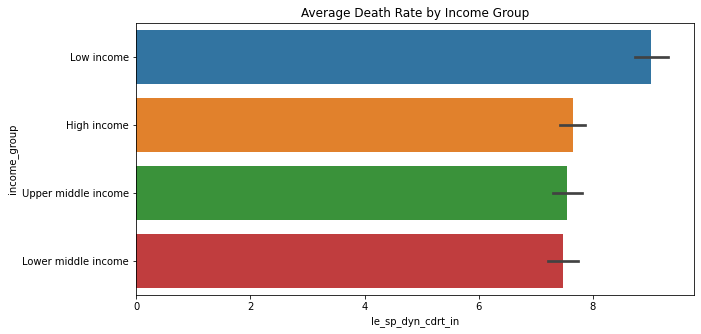

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='le_sp_dyn_cdrt_in', y='income_group', data=health_df_new, order=['Low income', 'High income', 'Upper middle income', 'Lower middle income'])
plt.title("Average Death Rate by Income Group")


To see the average death rate by region;

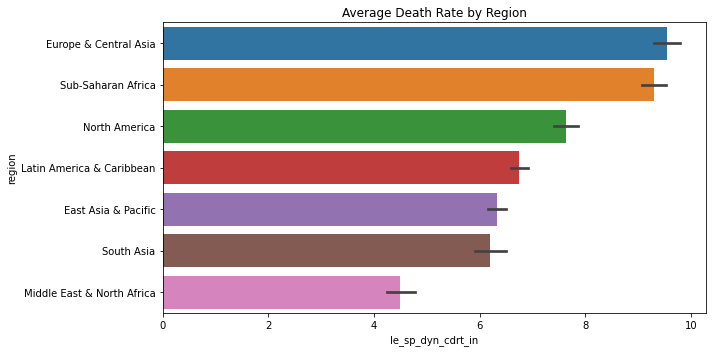

In [ ]:
plt.figure(figsize=(10,5))
sns.barplot(x='le_sp_dyn_cdrt_in', y='region', data=health_df_new, order=['Europe & Central Asia', 'Sub-Saharan Africa', 'North America', 'Latin America & Caribbean', 'East Asia & Pacific', 'South Asia', 'Middle East & North Africa'])
plt.title("Average Death Rate by Region")
plt.tight_layout()

Europe&Central Asia and Sub-Saharan Africa have the highest death rate. Middle East and North Africa have the lowest one. It is maybe due to that Europe and Central Asia have relatively older population. See link for the definiton of Death rate;
https://datacatalog.worldbank.org/death-rate-crude-1000-people-0#:~:text=Crude%20death%20rate%20indicates%20the,1%2C000%20population%20estimated%20at%20midyear.&text=World%20Population%20Prospects%3A%202019%20Revision. 

See link for Europe has the oldest population.

https://www.prb.org/countries-with-the-oldest-populations/#:~:text=Asia%20and%20Europe%20are%20home,those%20ages%2065%20and%20above.

To see how many countries are there in the each income group and region;

In [ ]:
count_table = pd.crosstab(health_df_new["region"], health_df_new["income_group"])
count_table

income_group,High income,Low income,Lower middle income,Upper middle income
region,,,,
East Asia & Pacific,108,0,117,81
Europe & Central Asia,309,9,36,135
Latin America & Caribbean,99,9,36,180
Middle East & North Africa,72,18,45,54
North America,26,0,0,0
South Asia,0,18,36,18
Sub-Saharan Africa,9,216,135,54


Some interesting findings here. South Asia has no High income country. Europe and Central Asia have the highest number of High income country. Middle East & North Africa seems to be well balanced.

To see income groups by region;

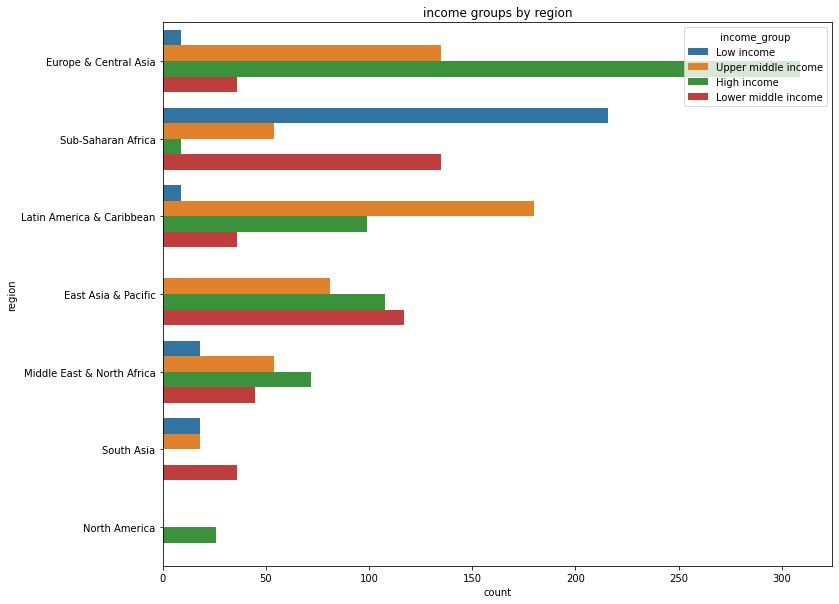

In [ ]:
plt.figure(figsize=(12,10))
sns.countplot(y="region", hue="income_group", data=health_df_new, order=['Europe & Central Asia', 'Sub-Saharan Africa', 'Latin America & Caribbean', 'East Asia & Pacific', 'Middle East & North Africa', 'South Asia', 'North America'])
plt.title("income groups by region")
plt.show()

WorldCloud image;

In [ ]:
from wordcloud import WordCloud
wordcloud = WordCloud(background_color="random").generate(" ".join(health_df_new["region"]))
plt.figure(figsize=(15,10))
# Display the generated image:
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

NameError: ignored

To creat pivot table;

In [ ]:
health_df_pivot =  health_df_new.pivot(index="year", columns="country_name", values="le_sp_dyn_cdrt_in")
health_df_pivot.head(10)

country_name,Afghanistan,Albania,Algeria,Andorra,Angola,Antigua and Barbuda,Argentina,Armenia,Aruba,Australia,Austria,Azerbaijan,"Bahamas, The",Bahrain,Bangladesh,Barbados,Belarus,Belgium,Belize,Benin,Bermuda,Bhutan,Bolivia,Bosnia and Herzegovina,Botswana,Brazil,Brunei Darussalam,Bulgaria,Burkina Faso,Burundi,Cabo Verde,Cambodia,Cameroon,Canada,Central African Republic,Chad,Channel Islands,Chile,China,Colombia,...,Solomon Islands,Somalia,South Africa,South Sudan,Spain,Sri Lanka,St. Kitts and Nevis,St. Lucia,St. Vincent and the Grenadines,Sudan,Suriname,Sweden,Switzerland,Syrian Arab Republic,Tajikistan,Tanzania,Thailand,Timor-Leste,Togo,Tonga,Trinidad and Tobago,Tunisia,Turkey,Turkmenistan,Tuvalu,Uganda,Ukraine,United Arab Emirates,United Kingdom,United States,Uruguay,Uzbekistan,Vanuatu,"Venezuela, RB",Vietnam,Virgin Islands (U.S.),West Bank and Gaza,"Yemen, Rep.",Zambia,Zimbabwe
year,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-01-01,8.250,6.841,4.656,2.800,11.680,6.055,7.708,9.739,7.918,6.500,9.200,5.900,6.566,2.327,5.734,8.368,14.500,9.700,4.597,10.094,7.300,6.414,7.448,9.747,9.146,6.045,3.831,14.900,10.645,10.113,6.005,6.512,11.583,7.000,16.329,14.598,8.046,5.631,7.110,5.247,...,4.752,12.869,12.085,11.984,8.200,6.020,nan,6.577,7.790,8.122,7.017,9.600,8.000,4.495,5.746,9.212,7.191,6.505,10.175,7.179,7.770,6.194,5.697,7.214,nan,9.659,15.200,1.403,8.900,7.995,9.324,4.900,5.526,5.560,5.810,6.600,3.511,6.189,10.051,13.679
2011-01-01,7.936,6.915,4.670,nan,11.039,6.085,7.694,9.753,8.061,6.600,9.100,5.900,6.606,2.324,5.673,8.454,14.300,9.400,4.582,9.928,6.600,6.356,7.304,9.870,8.391,6.071,3.887,14.700,10.195,9.728,5.991,6.401,11.277,7.100,15.817,14.161,8.002,5.677,7.140,5.277,...,4.672,12.601,11.483,11.669,8.300,6.076,nan,6.712,8.004,7.946,7.019,9.500,7.800,4.878,5.643,8.751,7.213,6.401,9.826,7.205,7.815,6.241,5.619,7.189,nan,9.114,14.500,1.382,8.700,8.073,9.349,4.900,5.529,5.676,5.867,6.600,3.508,6.094,9.304,12.384
2012-01-01,7.645,6.996,4.685,3.900,10.451,6.116,7.680,9.761,8.205,6.600,9.400,5.900,6.634,2.326,5.625,8.540,13.400,9.800,4.580,9.775,6.500,6.316,7.175,9.981,7.713,6.106,3.944,15.000,9.789,9.373,5.961,6.308,10.968,7.100,15.280,13.752,7.963,5.728,7.150,5.307,...,4.592,12.331,10.918,11.399,8.600,6.135,nan,6.840,8.234,7.788,7.039,9.700,8.000,5.229,5.542,8.305,7.241,6.332,9.514,7.225,7.866,6.274,5.547,7.167,nan,8.605,14.500,1.369,8.900,8.102,9.376,4.900,5.527,5.822,5.930,6.700,3.505,6.030,8.637,11.167
2013-01-01,7.380,7.096,4.699,nan,9.921,6.151,7.665,9.774,8.347,6.400,9.400,5.800,6.651,2.331,5.589,8.625,13.200,9.800,4.588,9.628,6.800,6.288,7.062,10.088,7.122,6.147,4.009,14.400,9.426,9.052,5.918,6.228,10.657,7.200,14.725,13.380,7.925,5.785,7.160,5.339,...,4.516,12.060,10.430,11.171,8.300,6.204,nan,6.947,8.462,7.649,7.071,9.400,8.000,5.510,5.435,7.887,7.279,6.276,9.244,7.239,7.925,6.294,5.484,7.145,nan,8.138,14.600,1.363,9.000,8.215,9.401,4.800,5.514,5.997,5.994,6.900,3.501,5.992,8.055,10.115
2014-01-01,7.141,7.219,4.709,nan,9.454,6.188,7.651,9.796,8.488,6.600,9.200,5.800,6.661,2.337,5.565,8.708,12.800,9.300,4.603,9.481,7.600,6.270,6.966,10.194,6.634,6.195,4.081,15.100,9.105,8.767,5.866,6.159,10.347,7.300,14.164,13.053,7.890,5.848,7.160,5.373,...,4.444,11.793,10.044,10.983,8.500,6.282,8.100,7.028,8.678,7.530,7.114,9.200,7.800,5.697,5.322,7.503,7.327,6.225,9.020,7.245,7.993,6.301,5.436,7.122,nan,7.716,14.700,1.366,8.800,8.237,9.423,4.900,5.489,6.197,6.060,7.100,3.495,5.974,7.565,9.277
2015-01-01,6.929,7.367,4.715,nan,9.052,6.227,7.638,9.823,8.627,6.600,9.600,5.700,6.671,2.346,5.549,8.789,12.600,9.800,4.624,9.332,7.400,6.257,6.890,10.305,6.259,6.250,4.162,15.300,8.823,8.517,5.807,6.099,10.046,7.400,13.621,12.770,7.858,5.917,7.110,5.410,...,4.380,11.534,9.769,10.826,9.100,6.368,nan,7.084,8.870,7.428,7.164,9.300,8.200,5.771,5.201,7.161,7.389,6.169,8.841,7.240,8.070,6.298,5.404,7.098,nan,7.345,14.900,1.377,9.200,8.440,9.440,4.900,5.450,6.408,6.126,7.300,3.488,5.969,7.169,8.673
2016-01-01,6

I realized that there is no value in year 2019. So it's better to remove it from our dataset.

In [ ]:
health_df_new = health_df_new[health_df_new.year != '2019-01-01']

I dropped year 2019 from my dataset. Let's validate this.

In [ ]:
year_2019_df = (health_df_new["year"] == "2019-01-01")
year_2019_df.sum()

0

In [ ]:
health_df_new.tail()

,year,country_name,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
1815,2014-01-01,Zimbabwe,Sub-Saharan Africa,Lower middle income,9.277,92.000,91.000,6486479.000,59.892,56.632,58.410,40.400,13586681.000,5.342,67.496,32.504,34.978,3.974,91.000,91.000,92.000,413.960,359.189,19051.000,11447.000,27058.000,65.473,38.251,42.429,54.693,2.879,1.020,10.000,1.294,1.977
1816,2015-01-01,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.673,86.000,87.000,6587744.000,60.984,57.778,59.534,38.500,13814629.000,5.302,67.615,32.385,33.981,3.896,87.000,87.000,88.000,396.789,339.493,18006.000,10815.000,25433.000,64.986,37.568,42.552,54.603,2.844,1.020,7.900,1.297,1.840
1817,2016-01-01,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.286,95.000,90.000,6686030.000,61.719,58.565,60.294,36.300,14030390.000,5.253,67.704,32.296,32.864,3.804,90.000,90.000,90.000,379.617,319.797,16693.000,10235.000,23326.000,64.512,36.892,42.665,54.473,2.862,1.020,8.600,1.275,1.681
1818,2017-01-01,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.044,90.000,89.000,6792647.000,62.220,59.105,60.812,35.400,14236745.000,5.168,67.763,32.237,31.732,3.707,89.000,89.000,89.000,362.446,300.101,16015.000,9696.000,22519.000,64.051,36.221,42.598,54.506,2.896,1.020,8.300,1.277,1.547
1819,2018-01-01,Zimbabwe,Sub-Saharan Africa,Lower middle income,7.883,88.000,89.000,6907202.000,62.598,59.501,61.195,33.900,14439018.000,5.087,67.791,32.209,30.676,3.615,89.000,89.000,89.000,373.207,337.702,15043.000,9241.000,20756.000,nan,nan,42.401,54.659,2.940,1.020,7.700,1.324,1.452


Let's create income filter and see Low income countries.

In [ ]:
income_filter = health_df_new.income_group == "Low income" 
health_df_new[income_filter]


,year,country_name,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
0,2010-01-01,Afghanistan,South Asia,Low income,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
1,2011-01-01,Afghanistan,South Asia,Low income,7.936,64.000,68.000,7499332.000,63.000,60.190,61.553,61.900,30117413.000,11.488,76.052,23.948,38.750,5.770,68.000,68.000,68.000,266.320,224.280,72161.000,54309.000,97906.000,50.927,35.457,47.702,49.944,2.354,1.060,44.000,4.028,2.866
2,2012-01-01,Afghanistan,South Asia,Low income,7.645,59.000,67.000,7891605.000,63.514,60.675,62.054,59.500,31161376.000,11.508,75.840,24.160,37.690,5.562,67.000,67.000,67.000,261.340,219.588,69610.000,52740.000,93956.000,53.532,36.750,47.090,50.524,2.386,1.060,44.000,4.289,3.128
3,2013-01-01,Afghanistan,South Asia,Low income,7.380,57.000,64.000,8307325.000,63.999,61.133,62.525,57.300,32269589.000,11.534,75.627,24.373,36.670,5.359,64.000,64.000,62.000,257.135,215.307,67154.000,51219.000,90103.000,56.170,38.056,46.387,51.193,2.420,1.060,43.000,4.372,3.213
4,2014-01-01,Afghanistan,South Asia,Low income,7.141,60.000,62.000,8741565.000,64.453,61.563,62.966,55.100,33370794.000,11.448,75.413,24.587,35.706,5.163,62.000,62.000,58.000,252.930,211.026,64808.000,49715.000,86378.000,58.841,39.375,45.641,51.908,2.452,1.060,43.000,4.230,3.072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1797,2014-01-01,"Yemen, Rep.",Middle East & North Africa,Low income,5.974,67.000,73.000,5604445.000,67.770,64.404,66.066,42.900,25823485.000,13.467,65.835,34.165,32.735,4.214,73.000,73.000,67.000,247.241,200.664,35830.000,22787.000,45620.000,61.391,57.413,41.070,56.158,2.773,1.050,5.600,4.444,1.738
1798,2015-01-01,"Yemen, Rep.",Middle East & North Africa,Low income,5.969,67.000,69.000,5845660.000,67.789,64.419,66.085,42.900,26497889.000,13.395,65.223,34.777,32.197,4.103,69.000,69.000,63.000,244.968,198.071,36182.000,22977.000,46116.000,63.172,58.495,40.692,56.512,2.796,1.050,9.000,4.354,1.644
1799,2016-01-01,"Yemen, Rep.",Middle East & North Africa,Low income,5.972,70.000,71.000,6080279.000,67.789,64.417,66.087,42.900,27168210.000,13.307,64.606,35.394,31.627,3.994,71.000,71.000,65.000,242.694,195.478,36468.000,23139.000,46529.000,63.322,58.773,40.364,56.810,2.826,1.050,6.700,4.257,1.548
1800,2017-01-01,"Yemen, Rep.",Middle East & North Africa,Low income,5.978,65.000,68.000,6312623.000,67.786,64.413,66.086,42.900,27834821.000,13.152,63.984,36.016,31.040,3.890,68.000,68.000,62.000,240.420,192.885,36700.000,23320.000,46870.000,63.473,59.053,40.001,57.147,2.852,1.050,6.600,4.166,1.457


Let's see the countries who have death rate between 10 and 15 in Lower middle income group at year 2010

In [ ]:
dr_filter = (health_df_new.le_sp_dyn_cdrt_in >= 15) & (health_df_new.le_sp_dyn_cdrt_in <= 20) & (health_df_new.income_group == "Lower middle income") & (health_df_new.year == "2010-01-01")
health_df_new[dr_filter]

,year,country_name,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
521,2010-01-01,Eswatini,Sub-Saharan Africa,Lower middle income,16.233,94.000,89.000,323984.000,49.191,44.369,46.601,59.300,1064837.000,26.918,77.520,22.480,30.390,3.342,89.000,89.000,89.000,575.398,440.212,1908.000,644.000,2871.000,62.746,55.322,40.188,56.144,3.668,1.026,24.000,1.669,0.414
912,2010-01-01,Lesotho,Sub-Saharan Africa,Lower middle income,19.325,88.000,93.000,886436.000,48.074,42.412,45.100,77.400,1995581.000,26.814,75.202,24.798,29.042,3.302,93.000,94.000,92.000,588.836,508.157,4460.000,2240.000,5816.000,67.956,29.982,34.887,60.429,4.684,1.028,57.000,2.331,-0.396
1694,2010-01-01,Ukraine,Europe & Central Asia,Lower middle income,15.200,56.000,52.000,21665449.000,75.500,65.280,70.265,10.100,45870700.000,8.100,31.404,68.596,10.800,1.443,48.000,51.000,57.000,309.172,118.251,4967.000,3448.000,5732.000,95.074,95.670,14.126,70.167,15.707,1.065,18.000,-0.260,-0.696


**Filling in Missing Values**

Let's first see all variables' histogram together 

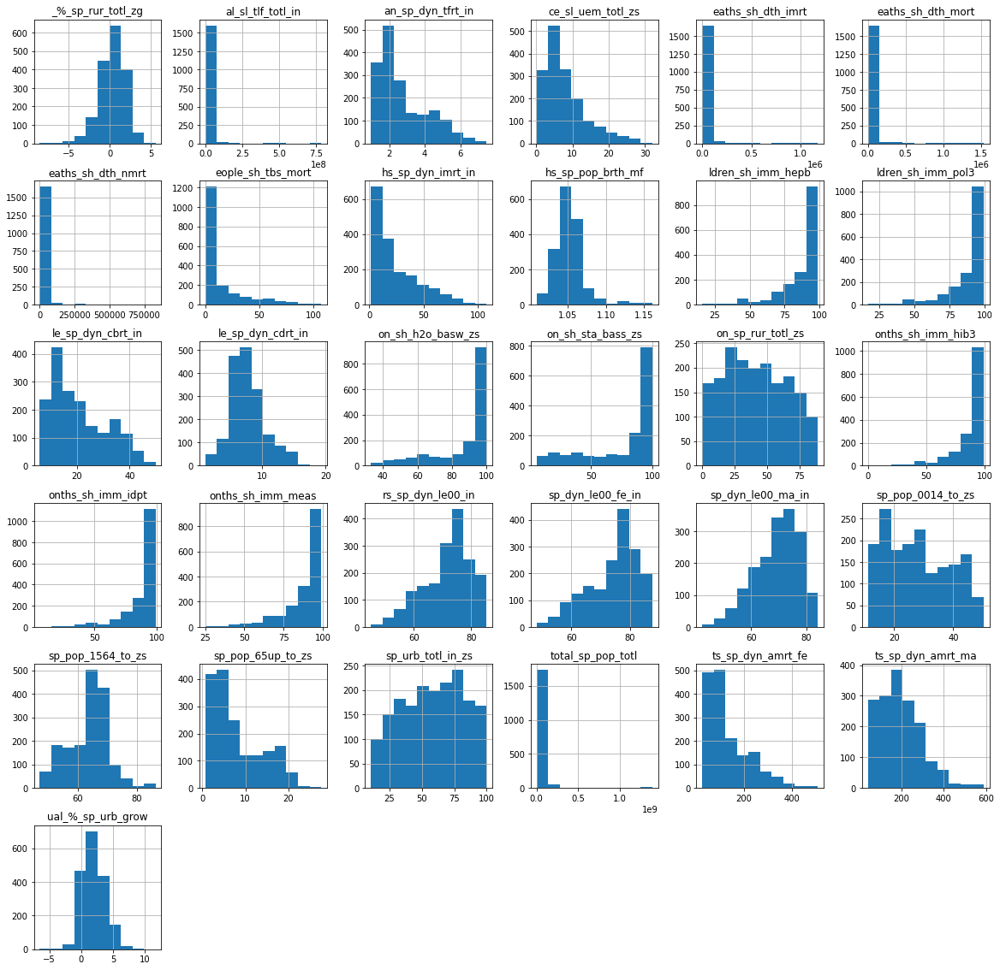

In [ ]:
fig = plt.figure(figsize = (20,20))
ax = fig.gca()
health_df_new.hist(ax=ax)
plt.show()

The most likely normally distributed variables are "le_sp_dyn_cdrt_in" and "sp_urb_grow"

Let's see boxplot of "le_sp_dyn_cdrt_in" death rate which is possible target value.

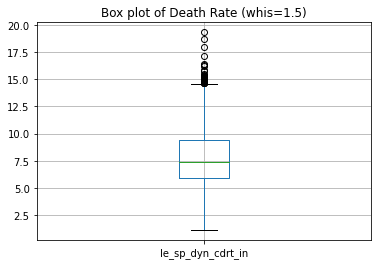

In [ ]:
boxplot = health_df_new.boxplot(column=['le_sp_dyn_cdrt_in'])
  
plt.title("Box plot of Death Rate (whis=1.5)")

plt.show()

Even if it is not too much, we have some outliers.

I want to see outliers year on year basis.

In [ ]:
health_df_new['year'] = health_df_new['year'].dt.year

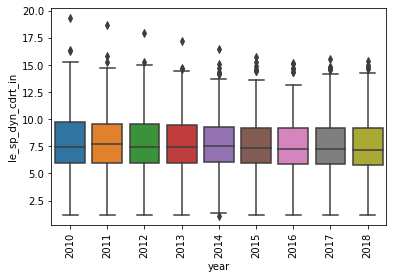

In [ ]:
ax = sns.boxplot(y="le_sp_dyn_cdrt_in", x="year", data=health_df_new);
ax.set_xticklabels(ax.get_xticklabels(), rotation=90);

In [ ]:
health_df_new.head()

,year,country_name,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
0,2010,Afghanistan,South Asia,Low income,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
1,2011,Afghanistan,South Asia,Low income,7.936,64.000,68.000,7499332.000,63.000,60.190,61.553,61.900,30117413.000,11.488,76.052,23.948,38.750,5.770,68.000,68.000,68.000,266.320,224.280,72161.000,54309.000,97906.000,50.927,35.457,47.702,49.944,2.354,1.060,44.000,4.028,2.866
2,2012,Afghanistan,South Asia,Low income,7.645,59.000,67.000,7891605.000,63.514,60.675,62.054,59.500,31161376.000,11.508,75.840,24.160,37.690,5.562,67.000,67.000,67.000,261.340,219.588,69610.000,52740.000,93956.000,53.532,36.750,47.090,50.524,2.386,1.060,44.000,4.289,3.128
3,2013,Afghanistan,South Asia,Low income,7.380,57.000,64.000,8307325.000,63.999,61.133,62.525,57.300,32269589.000,11.534,75.627,24.373,36.670,5.359,64.000,64.000,62.000,257.135,215.307,67154.000,51219.000,90103.000,56.170,38.056,46.387,51.193,2.420,1.060,43.000,4.372,3.213
4,2014,Afghanistan,South Asia,Low income,7.141,60.000,62.000,8741565.000,64.453,61.563,62.966,55.100,33370794.000,11.448,75.413,24.587,35.706,5.163,62.000,62.000,58.000,252.930,211.026,64808.000,49715.000,86378.000,58.841,39.375,45.641,51.908,2.452,1.060,43.000,4.230,3.072


Now I want to see outliers on a region and income group basis


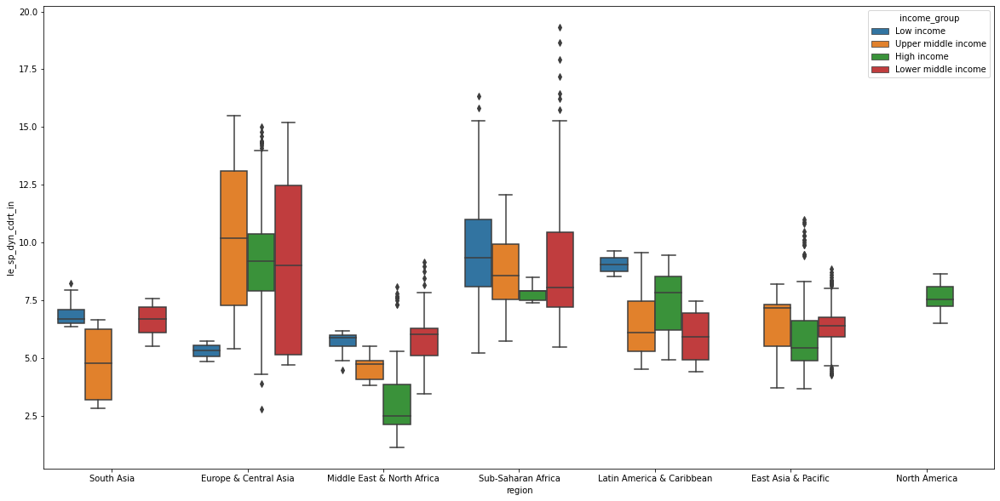

In [ ]:
plt.figure(figsize=(20,10))
sns.boxplot(y="le_sp_dyn_cdrt_in", x="region", hue="income_group", data=health_df_new);

Looks like North America and Latin America & Caribbean regions don't have any outliers. 

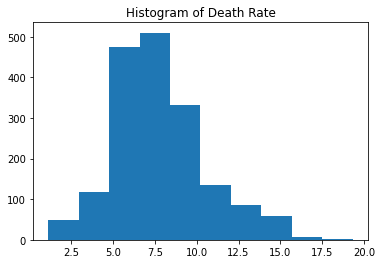

In [ ]:
plt.hist(health_df_new["le_sp_dyn_cdrt_in"])
plt.title("Histogram of Death Rate")
plt.show()

Potential target value death rate seems very close to normal distribution. 

Although I have too much varaibles and it is difficult to detect each and every distribution, let's see all data pairplot.

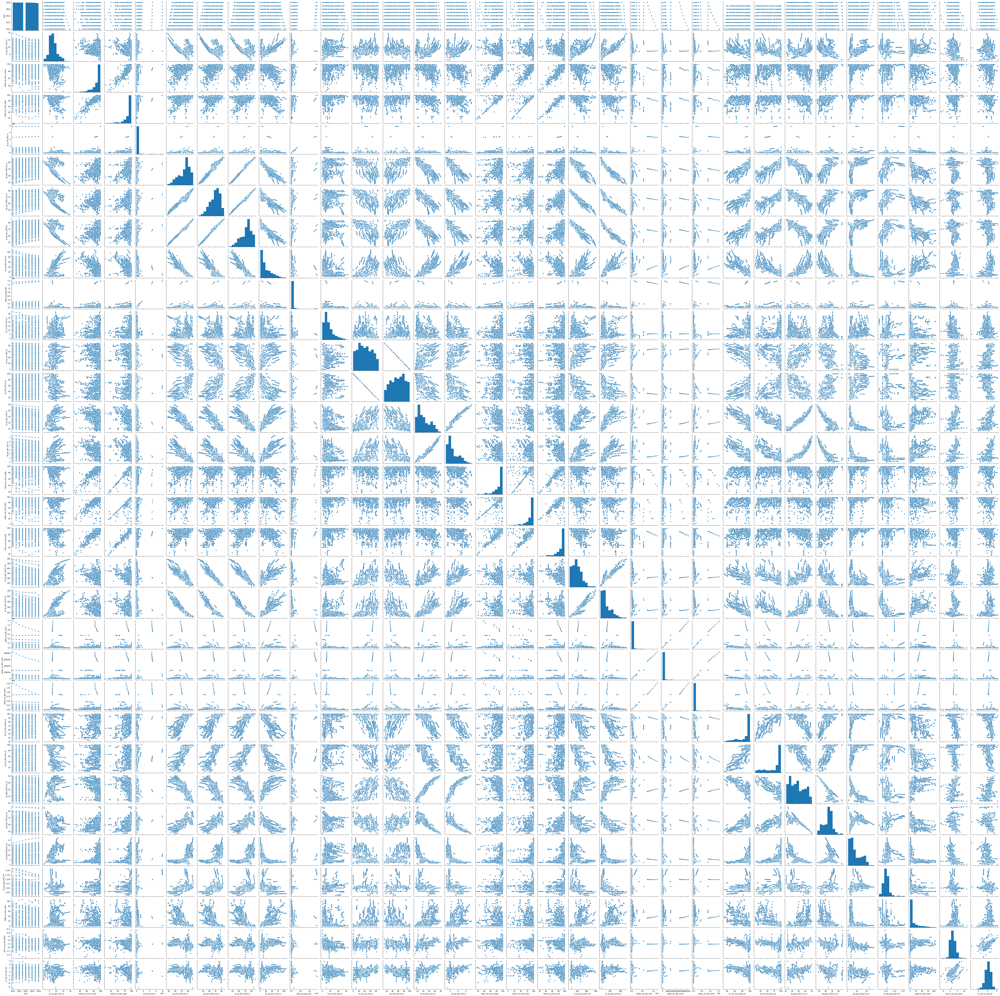

In [ ]:
sns.pairplot(health_df_new);

Text(0.5, 1.0, 'Death Rate')

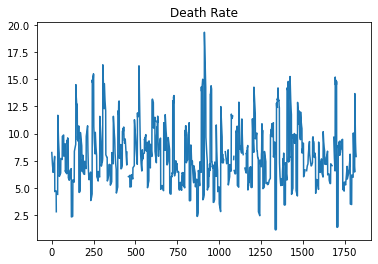

In [ ]:
health_df_new.le_sp_dyn_cdrt_in.plot()
plt.title("Death Rate") 

**Outlier Detection**

Let's see all float columns together before detecting and treating outliers

In [ ]:
float_columns = list(health_df_new.columns[(health_df_new.dtypes.values == np.dtype('float64'))])
float_columns

['le_sp_dyn_cdrt_in',
 'onths_sh_imm_meas',
 'onths_sh_imm_idpt',
 'al_sl_tlf_totl_in',
 'sp_dyn_le00_fe_in',
 'sp_dyn_le00_ma_in',
 'rs_sp_dyn_le00_in',
 'hs_sp_dyn_imrt_in',
 'total_sp_pop_totl',
 'ce_sl_uem_totl_zs',
 'on_sp_rur_totl_zs',
 'sp_urb_totl_in_zs',
 'le_sp_dyn_cbrt_in',
 'an_sp_dyn_tfrt_in',
 'ldren_sh_imm_hepb',
 'onths_sh_imm_hib3',
 'ldren_sh_imm_pol3',
 'ts_sp_dyn_amrt_ma',
 'ts_sp_dyn_amrt_fe',
 'eaths_sh_dth_imrt',
 'eaths_sh_dth_nmrt',
 'eaths_sh_dth_mort',
 'on_sh_h2o_basw_zs',
 'on_sh_sta_bass_zs',
 'sp_pop_0014_to_zs',
 'sp_pop_1564_to_zs',
 'sp_pop_65up_to_zs',
 'hs_sp_pop_brth_mf',
 'eople_sh_tbs_mort',
 'ual_%_sp_urb_grow',
 '_%_sp_rur_totl_zg']

First, apply z_score to my target value death rate

In [ ]:
from scipy.stats import zscore

z_scores = zscore(health_df_new['le_sp_dyn_cdrt_in'], nan_policy= "omit")
for threshold in range(1,5):
    print("The score threshold is: {}".format(threshold))
    print("The indices of the outliers:")
    print(np.where(z_scores > threshold))
    print("Number of outliers is: {}".format(len((np.where(z_scores > threshold)[0]))))

The score threshold is: 1
The indices of the outliers:
(array([  36,   37,  144,  145,  146,  147,  148,  149,  150,  151,  152,
        161,  214,  242,  243,  244,  245,  246,  247,  248,  249,  250,
        251,  287,  288,  289,  290,  305,  306,  307,  308,  309,  310,
        311,  312,  313,  314,  315,  316,  317,  318,  319,  320,  321,
        322,  368,  369,  370,  371,  395,  396,  397,  398,  399,  400,
        401,  402,  403,  430,  494,  495,  496,  512,  513,  514,  515,
        516,  517,  518,  519,  520,  521,  522,  523,  524,  525,  526,
        599,  600,  601,  602,  603,  604,  605,  606,  607,  609,  610,
        611,  612,  613,  614,  615,  616,  628,  631,  632,  633,  634,
        669,  670,  678,  679,  680,  681,  723,  724,  725,  726,  727,
        728,  729,  730,  731,  800,  802,  820,  821,  894,  895,  896,
        897,  898,  899,  900,  901,  902,  912,  913,  914,  915,  916,
        917,  918,  919,  920,  947,  948,  949,  950,  951,  952,  

Now apply z_score to rest of the float data

In [ ]:
for column in float_columns:
   z_scores = zscore(health_df_new[column], nan_policy="omit")
   print(column)
   print(z_scores)
   #for threshold in range(1,5):
       
      #print("The score threshold is: {}".format(threshold))
      #print("The indices of the outliers:")
      #print(np.where(z_scores > threshold))
      #print("Number of outliers is: {}".format(len((np.where(z_scores > threshold)))))
      

le_sp_dyn_cdrt_in
[ 0.16686134  0.05382384 -0.05093384 ...  0.17982106  0.09270298
  0.03474427]
onths_sh_imm_meas
[-1.99264637 -1.83861314 -2.22369622 ...  0.54890195  0.16381887
  0.00978564]
onths_sh_imm_idpt
[-1.6414906  -1.4950251  -1.56825785 ...  0.11609545  0.0428627
  0.0428627 ]
al_sl_tlf_totl_in
[-0.15264291 -0.14793444 -0.14226785 ... -0.15968301 -0.15814287
 -0.15648806]
sp_dyn_le00_fe_in
[-1.376851   -1.31325145 -1.25282599 ... -1.46384484 -1.40494766
 -1.36051026]
sp_dyn_le00_ma_in
[-1.20818193 -1.14442689 -1.08343834 ... -1.34876996 -1.28086518
 -1.23106835]
rs_sp_dyn_le00_in
[-1.30832633 -1.24388724 -1.18239393 ... -1.39841832 -1.33483842
 -1.28782856]
hs_sp_dyn_imrt_in
[1.84987131 1.73987447 1.62987763 ... 0.56657485 0.52532604 0.45657801]
total_sp_pop_totl
[-0.04721805 -0.04040163 -0.03276557 ... -0.15807    -0.15656062
 -0.15508109]
ce_sl_uem_totl_zs
[ 0.61066191  0.61134458  0.61475821 ... -0.45283279 -0.46734035
 -0.48116532]
on_sp_rur_totl_zs
[1.46357057 1.454718

NumPy's percentile() method returns the values of the given percentiles. In my case, I give 75 and 25 as parameters which corresponds to the third and the first quartile.

In [ ]:
q75, q25 = np.percentile(health_df_new["le_sp_dyn_cdrt_in"], [75 ,25])
iqr = q75 - q25

for threshold in np.arange(1,5,0.5):
    min_val = q25 - (iqr*threshold)
    max_val = q75 + (iqr*threshold)
    print("The score threshold is: {}".format(threshold))
    print("Number of outliers is: {}".format(
        len((np.where((health_df_new["le_sp_dyn_cdrt_in"] > max_val) 
                      | (health_df_new["le_sp_dyn_cdrt_in"] < min_val))[0]))
    ))

The score threshold is: 1.0
Number of outliers is: 0
The score threshold is: 1.5
Number of outliers is: 0
The score threshold is: 2.0
Number of outliers is: 0
The score threshold is: 2.5
Number of outliers is: 0
The score threshold is: 3.0
Number of outliers is: 0
The score threshold is: 3.5
Number of outliers is: 0
The score threshold is: 4.0
Number of outliers is: 0
The score threshold is: 4.5
Number of outliers is: 0


Actually I have no more outliers and no need to apply extra method to deal with outliers but just to see what does it look like, I applied Tukey's method known also as Interquartile Range (IQR). As expected, I don't have any outliers either.

Now I will apply one-way winsorization to the highest end of the value distribution. As I have a lot of extreme values, I set the values of the outliers to the value of the 90th percentile.

In [ ]:
from scipy.stats.mstats import winsorize
winsorized_le_sp_dyn_cdrt_in = winsorize(health_df_new["le_sp_dyn_cdrt_in"], (0, 0.10))
winsorized_le_sp_dyn_cdrt_in

masked_array(data=[8.25 , 7.936, 7.645, ..., 8.286, 8.044, 7.883],
             mask=False,
       fill_value=1e+20)

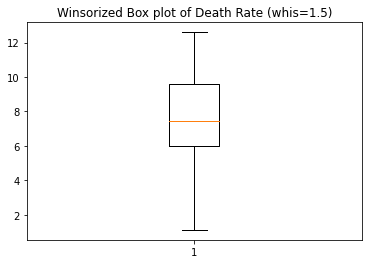

In [ ]:
plt.boxplot(winsorized_le_sp_dyn_cdrt_in)
plt.title("Winsorized Box plot of Death Rate (whis=1.5)")
plt.show()

As you may see, after winsorization I don't have any outliers.

Now I can move to correlation to see the relationship between variables.

In [ ]:
health_df_new.corr()

,year,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
year,1.000,-0.052,-0.020,-0.022,0.007,0.083,0.090,0.088,-0.086,0.010,-0.057,-0.033,0.033,-0.067,-0.056,-0.009,0.003,-0.029,-0.058,-0.046,-0.021,-0.017,-0.023,0.048,0.032,-0.046,0.011,0.070,-0.023,-0.041,-0.032,-0.024
le_sp_dyn_cdrt_in,-0.052,1.000,-0.247,-0.250,-0.017,-0.300,-0.384,-0.342,0.269,-0.015,0.242,0.168,-0.168,0.042,0.107,-0.258,-0.243,-0.243,0.490,0.420,0.061,0.026,0.082,-0.254,-0.230,-0.028,-0.290,0.396,-0.082,0.242,-0.251,-0.148
onths_sh_imm_meas,-0.020,-0.247,1.000,0.913,0.048,0.594,0.559,0.582,-0.645,0.016,0.044,-0.318,0.318,-0.566,-0.611,0.827,0.749,0.914,-0.451,-0.549,-0.225,-0.184,-0.251,0.585,0.558,-0.570,0.581,0.359,0.205,-0.508,-0.308,-0.276
onths_sh_imm_idpt,-0.022,-0.250,0.913,1.000,0.035,0.558,0.550,0.559,-0.623,0.002,0.079,-0.284,0.284,-0.532,-0.566,0.902,0.831,0.971,-0.463,-0.528,-0.230,-0.188,-0.256,0.549,0.504,-0.523,0.519,0.345,0.164,-0.472,-0.263,-0.251
al_sl_tlf_totl_in,0.007,-0.017,0.048,0.035,1.000,0.026,0.036,0.030,-0.031,0.976,-0.097,0.035,-0.035,-0.083,-0.082,0.003,-0.136,0.035,-0.056,-0.051,0.553,0.572,0.514,0.038,-0.015,-0.073,0.099,0.016,0.385,0.027,0.032,-0.117
sp_dyn_le00_fe_in,0.083,-0.300,0.594,0.558,0.026,1.000,0.969,0.993,-0.944,-0.007,0.039,-0.607,0.607,-0.890,-0.860,0.430,0.439,0.581,-0.873,-0.956,-0.255,-0.206,-0.281,0.847,0.865,-0.872,0.741,0.723,0.418,-0.700,-0.574,-0.504
sp_dyn_le00_ma_in,0.090,-0.384,0.559,0.550,0.036,0.969,1.000,0.992,-0.902,0.008,0.005,-0.591,0.591,-0.845,-0.806,0.417,0.459,0.567,-0.944,-0.945,-0.216,-0.168,-0.241,0.813,0.821,-0.825,0.713,0.671,0.396,-0.692,-0.477,-0.435
rs_sp_dyn_le00_in,0.088,-0.342,0.582,0.559,0.030,0.993,0.992,1.000,-0.931,-0.000,0.023,-0.603,0.603,-0.874,-0.840,0.428,0.453,0.579,-0.914,-0.957,-0.238,-0.189,-0.264,0.836,0.849,-0.855,0.732,0.704,0.410,-0.701,-0.531,-0.473
hs_sp_dyn_imrt_in,-0.086,0.269,-0.645,-0.623,-0.031,-0.944,-0.902,-0.931,1.000,0.008,-0.099,0.563,-0.563,0.870,0.858,-0.506,-0.481,-0.640,0.773,0.893,0.299,0.248,0.324,-0.842,-0.853,0.845,-0.754,-0.660,-0.368,0.716,0.572,0.486
total_sp_pop_totl,0.010,-0.015,0.016,0.002,0.976,-0.007,0.008,-0.000,0.008,1.000,-0.093,0.057,-0.057,-0.046,-0.054,-0.038,-0.156,-0.000,-0.034,-0.028,0.691,0.719,0.649,0.015,-0.050,-0.042,0.069,-0.005,0.365,0.061,0.054,-0.070


A I have too much variables, I want to describe correlation threshold as 0.25 and want to see correlations only higher than 0.25. I also want to see potential fetaures in the table which have a higher than 0.25 correlation with my target value death rate.



**Correlation Matrix (filtered for correlation above 0.25):**


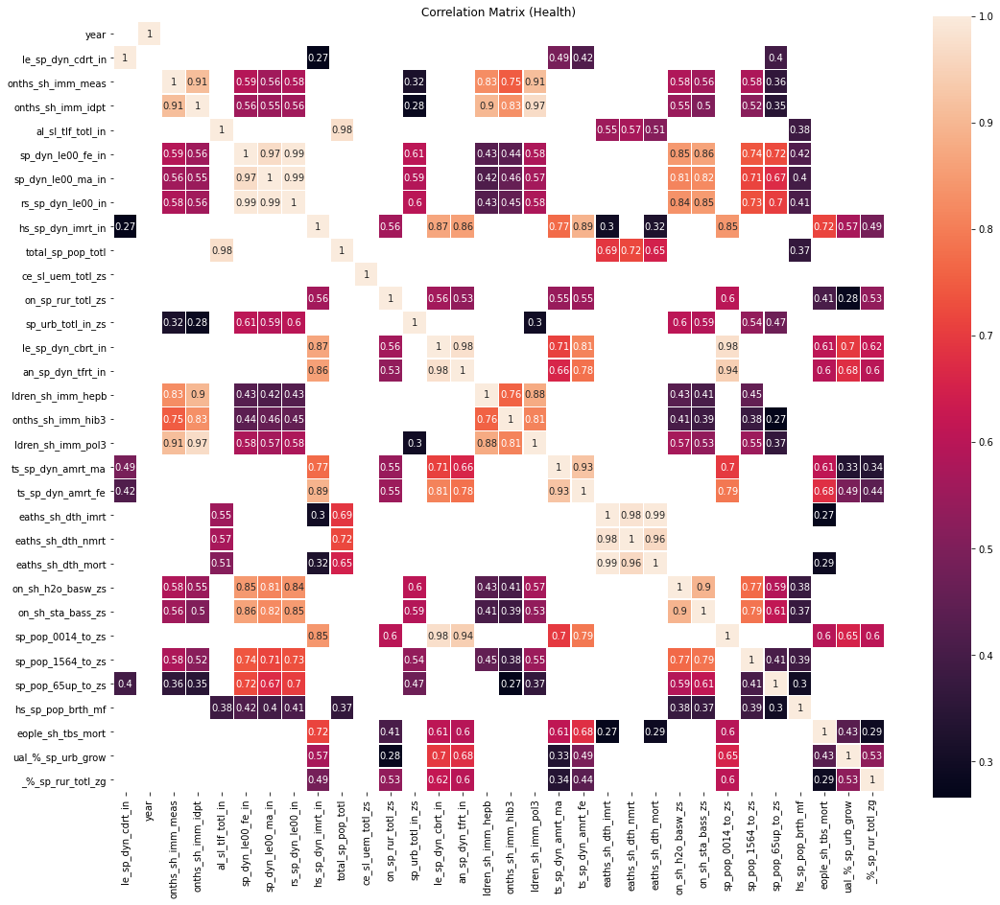

potential features are: ['hs_sp_dyn_imrt_in', 'ts_sp_dyn_amrt_ma', 'ts_sp_dyn_amrt_fe', 'sp_pop_65up_to_zs']


In [ ]:
def draw_heatmap(health_df_new,corr_thresh=.25): 
    # make the correlation matrix.
    corr_mat = health_df_new.corr()

    # move the column to head of list using index, pop and insert
    cols = list(corr_mat)
    cols.insert(0, cols.pop(cols.index('le_sp_dyn_cdrt_in')))

    # reorder
    corr_mat = corr_mat.loc[:, cols]
    corr_mat.sort_values(by=['le_sp_dyn_cdrt_in'],ascending=False)

    # figure aesthetics
    plt.figure(figsize=(18,15))
    plt.plot()
    
    # draw the heatmap using seaborn.
    sns.heatmap(corr_mat[(corr_mat > corr_thresh)], square=True, annot=True, linewidths=.5)
    plt.title("Correlation Matrix (Health)")
    print("**Correlation Matrix (filtered for correlation above {}):**".format(corr_thresh))
    plt.show()
    
    # return features that correlate with the target equal to corr_thresh or higher
    features = corr_mat[(corr_mat > corr_thresh)]
    features = features.index[features['le_sp_dyn_cdrt_in'] >= corr_thresh].tolist()
    features.remove('le_sp_dyn_cdrt_in')
    print('potential features are: {}'.format(features))
    return features

corr_thresh = 0.25
features = draw_heatmap(health_df_new,corr_thresh)

Above table is ok but only shows positive correlation as I describe threshold as 0.25. But I may also have some negative correlations. So, let's see the correlation sorted values by potential target value le_sp_dyn_cdrt_in (death rate) in ascending order.

In [ ]:
correlation = health_df_new.corr()
correlation = correlation.sort_values(by=['le_sp_dyn_cdrt_in'], ascending=False)

correlation[['le_sp_dyn_cdrt_in']]

,le_sp_dyn_cdrt_in
le_sp_dyn_cdrt_in,1.000
ts_sp_dyn_amrt_ma,0.490
ts_sp_dyn_amrt_fe,0.420
sp_pop_65up_to_zs,0.396
hs_sp_dyn_imrt_in,0.269
ce_sl_uem_totl_zs,0.242
eople_sh_tbs_mort,0.242
on_sp_rur_totl_zs,0.168
an_sp_dyn_tfrt_in,0.107
eaths_sh_dth_mort,0.082


There is no very high variable in my dataset correlated with Death rate. It is good for my model as very high and dominated correlation might be risky for model. 
Highest correlated variables with Death rate are;

Mortality Rate Male (ts_sp_dyn_amrt_ma) 49% 

Mortality Rate Female (ts_sp_dyn_amrt_fe) 42% 

Population ages 65 and above (sp_pop_65up_to_zs) 40%. 

Mortality rates and death rate are very close variables.
Population ages 65 and above is expected correlate with death rate.
Life expectancy at birth, male & Life expectancy at birth, female have the strongest negative correlation with Death rate which is expected. So those variables are potential features for my model. I will check each of them by trial and error method and pick up the best fit ones with my model.

Let's check If I have any null values for categorical variables; 

In [ ]:
health_df_new.income_group.isnull().sum()

0

In [ ]:
health_df_new.region.isnull().sum()

0

I don't have any null values for categorical variables.

To see unique country names;

In [ ]:
health_df_new.country_name.unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas, The', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin',
       'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Central African Republic', 'Chad', 'Channel Islands',
       'Chile', 'China', 'Colombia', 'Comoros', 'Congo, Dem. Rep.',
       'Congo, Rep.', 'Costa Rica', 'Croatia', 'Cuba', 'Cyprus',
       'Czech Republic', 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Ecuador', 'Egypt, Arab Rep.', 'El Salvador',
       'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia',
       'Faroe Islands', 'Fiji', 'Finland', 'France', 'French Polynesia',
       'Gabon', 'Gambia, The', 'Georgia'

To see what countries have null values for my target value;

In [ ]:
health_df_new[health_df_new['le_sp_dyn_cdrt_in'].isna()]["country_name"].unique()

array(['Andorra', 'Dominica', 'Marshall Islands', 'Monaco', 'Nauru',
       'St. Kitts and Nevis', 'Tuvalu'], dtype=object)

Now, index the data based on country_name

In [ ]:
health_df_new.set_index("country_name")

,year,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
country_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Afghanistan,2010,South Asia,Low income,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
Afghanistan,2011,South Asia,Low income,7.936,64.000,68.000,7499332.000,63.000,60.190,61.553,61.900,30117413.000,11.488,76.052,23.948,38.750,5.770,68.000,68.000,68.000,266.320,224.280,72161.000,54309.000,97906.000,50.927,35.457,47.702,49.944,2.354,1.060,44.000,4.028,2.866
Afghanistan,2012,South Asia,Low income,7.645,59.000,67.000,7891605.000,63.514,60.675,62.054,59.500,31161376.000,11.508,75.840,24.160,37.690,5.562,67.000,67.000,67.000,261.340,219.588,69610.000,52740.000,93956.000,53.532,36.750,47.090,50.524,2.386,1.060,44.000,4.289,3.128
Afghanistan,2013,South Asia,Low income,7.380,57.000,64.000,8307325.000,63.999,61.133,62.525,57.300,32269589.000,11.534,75.627,24.373,36.670,5.359,64.000,64.000,62.000,257.135,215.307,67154.000,51219.000,90103.000,56.170,38.056,46.387,51.193,2.420,1.060,43.000,4.372,3.213
Afghanistan,2014,South Asia,Low income,7.141,60.000,62.000,8741565.000,64.453,61.563,62.966,55.100,33370794.000,11.448,75.413,24.587,35.706,5.163,62.000,62.000,58.000,252.930,211.026,64808.000,49715.000,86378.000,58.841,39.375,45.641,51.908,2.452,1.060,43.000,4.230,3.072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Zimbabwe,2014,Sub-Saharan Africa,Lower middle income,9.277,92.000,91.000,6486479.000,59.892,56.632,58.410,40.400,13586681.000,5.342,67.496,32.504,34.978,3.974,91.000,91.000,92.000,413.960,359.189,19051.000,11447.000,27058.000,65.473,38.251,42.429,54.693,2.879,1.020,10.000,1.294,1.977
Zimbabwe,2015,Sub-Saharan Africa,Lower middle income,8.673,86.000,87.000,6587744.000,60.984,57.778,59.534,38.500,13814629.000,5.302,67.615,32.385,33.981,3.896,87.000,87.000,88.000,396.789,339.493,18006.000,10815.000,25433.000,64.986,37.568,42.552,54.603,2.844,1.020,7.900,1.297,1.840
Zimbabwe,2016,Sub-Saharan Africa,Lower middle income,8.286,95.000,90.000,6686030.000,61.719,58.565,60.294,36.300,14030390.000,5.253,67.704,32.296,32.864,3.804,90.000,90.000,90.000,379.617,319.797,16693.000,10235.000,23326.000,64.512,36.892,42.665,54.473,2.862,1.020,8.600,1.275,1.681


Now, it's time to remove those countries from my dataset as they don't have any value for my target variable.

In [ ]:
to_drop = ['Andorra', 'Dominica', 'Marshall Islands', 'Monaco', 'Nauru','St. Kitts and Nevis', 'Tuvalu']

health_df_new.query('country_name not in @to_drop', inplace=True)

In [ ]:
health_df_new.query('country_name in ["Andorra", "Dominica", "Marshall Islands", "Monaco", "Nauru", "St. Kitts and Nevis", "Tuvalu"]').sum()


year                0.000
country_name        0.000
region              0.000
income_group        0.000
le_sp_dyn_cdrt_in   0.000
onths_sh_imm_meas   0.000
onths_sh_imm_idpt   0.000
al_sl_tlf_totl_in   0.000
sp_dyn_le00_fe_in   0.000
sp_dyn_le00_ma_in   0.000
rs_sp_dyn_le00_in   0.000
hs_sp_dyn_imrt_in   0.000
total_sp_pop_totl   0.000
ce_sl_uem_totl_zs   0.000
on_sp_rur_totl_zs   0.000
sp_urb_totl_in_zs   0.000
le_sp_dyn_cbrt_in   0.000
an_sp_dyn_tfrt_in   0.000
ldren_sh_imm_hepb   0.000
onths_sh_imm_hib3   0.000
ldren_sh_imm_pol3   0.000
ts_sp_dyn_amrt_ma   0.000
ts_sp_dyn_amrt_fe   0.000
eaths_sh_dth_imrt   0.000
eaths_sh_dth_nmrt   0.000
eaths_sh_dth_mort   0.000
on_sh_h2o_basw_zs   0.000
on_sh_sta_bass_zs   0.000
sp_pop_0014_to_zs   0.000
sp_pop_1564_to_zs   0.000
sp_pop_65up_to_zs   0.000
hs_sp_pop_brth_mf   0.000
eople_sh_tbs_mort   0.000
ual_%_sp_urb_grow   0.000
_%_sp_rur_totl_zg   0.000
dtype: float64

In [ ]:
health_df_new

,year,country_name,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
0,2010,Afghanistan,South Asia,Low income,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
1,2011,Afghanistan,South Asia,Low income,7.936,64.000,68.000,7499332.000,63.000,60.190,61.553,61.900,30117413.000,11.488,76.052,23.948,38.750,5.770,68.000,68.000,68.000,266.320,224.280,72161.000,54309.000,97906.000,50.927,35.457,47.702,49.944,2.354,1.060,44.000,4.028,2.866
2,2012,Afghanistan,South Asia,Low income,7.645,59.000,67.000,7891605.000,63.514,60.675,62.054,59.500,31161376.000,11.508,75.840,24.160,37.690,5.562,67.000,67.000,67.000,261.340,219.588,69610.000,52740.000,93956.000,53.532,36.750,47.090,50.524,2.386,1.060,44.000,4.289,3.128
3,2013,Afghanistan,South Asia,Low income,7.380,57.000,64.000,8307325.000,63.999,61.133,62.525,57.300,32269589.000,11.534,75.627,24.373,36.670,5.359,64.000,64.000,62.000,257.135,215.307,67154.000,51219.000,90103.000,56.170,38.056,46.387,51.193,2.420,1.060,43.000,4.372,3.213
4,2014,Afghanistan,South Asia,Low income,7.141,60.000,62.000,8741565.000,64.453,61.563,62.966,55.100,33370794.000,11.448,75.413,24.587,35.706,5.163,62.000,62.000,58.000,252.930,211.026,64808.000,49715.000,86378.000,58.841,39.375,45.641,51.908,2.452,1.060,43.000,4.230,3.072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1815,2014,Zimbabwe,Sub-Saharan Africa,Lower middle income,9.277,92.000,91.000,6486479.000,59.892,56.632,58.410,40.400,13586681.000,5.342,67.496,32.504,34.978,3.974,91.000,91.000,92.000,413.960,359.189,19051.000,11447.000,27058.000,65.473,38.251,42.429,54.693,2.879,1.020,10.000,1.294,1.977
1816,2015,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.673,86.000,87.000,6587744.000,60.984,57.778,59.534,38.500,13814629.000,5.302,67.615,32.385,33.981,3.896,87.000,87.000,88.000,396.789,339.493,18006.000,10815.000,25433.000,64.986,37.568,42.552,54.603,2.844,1.020,7.900,1.297,1.840
1817,2016,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.286,95.000,90.000,6686030.000,61.719,58.565,60.294,36.300,14030390.000,5.253,67.704,32.296,32.864,3.804,90.000,90.000,90.000,379.617,319.797,16693.000,10235.000,23326.000,64.512,36.892,42.665,54.473,2.862,1.020,8.600,1.275,1.681
1818,2017,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.044,90.000,89.000,6792647.000,62.220,59.105,60.812,35.400,14236745.000,5.168,67.763,32.237,31.732,3.707,89.000,89.000,89.000,362.446,300.101,16015.000,9696.000,22519.000,64.051,36.221,42.598,54.506,2.896,1.020,8.300,1.277,1.547


Above, you can see 1757 rows. So I managed to drop those countries from my dataset. Just to validate it;

In [ ]:
health_df_new.le_sp_dyn_cdrt_in.isnull().sum()

0

Yes, I definitely managed to remove countries from my dataset who have no values for my target value. The number of those countries is not too much (only 7) and those are the small countries who may have a problem to collect the data. So it is not a risk for my model.

Now,I want to see the Top 10 countries by death rate;


In [ ]:
dr_by_country = health_df_new.groupby("country_name")["le_sp_dyn_cdrt_in"].median().sort_values(ascending=False)
dr_by_country.head(10)

country_name
Lesotho                    16.433
Bulgaria                   15.100
Ukraine                    14.700
Latvia                     14.300
Serbia                     14.200
Central African Republic   14.164
Lithuania                  14.000
Georgia                    13.088
Chad                       13.053
Sierra Leone               13.025
Name: le_sp_dyn_cdrt_in, dtype: float64

Bulgaria is one of the top countries with the highest death rate. I found it interesting and searched more on google and found a link validating this:
https://www.bnr.bg/en/post/101234540/bulgaria-is-the-country-with-highest-mortality-rate#:~:text=Like%20in%20the%20rest%20of,non%2Dinfectious%20and%20cancer%20diseases.&text=The%20countries%20with%20high%20mortality,are%20facing%20a%20demographic%20collapse.

To see the bottom 10 countries by death rate;


In [ ]:
dr_by_country = health_df_new.groupby("country_name")["le_sp_dyn_cdrt_in"].median().sort_values(ascending=False)
dr_by_country.tail(10)

country_name
Jordan                 3.818
Macao SAR, China       3.700
West Bank and Gaza     3.495
Saudi Arabia           3.426
Maldives               3.157
Oman                   2.592
Kuwait                 2.404
Bahrain                2.337
United Arab Emirates   1.382
Qatar                  1.148
Name: le_sp_dyn_cdrt_in, dtype: float64

Gulf countries have the lowest death rate due to better healthcare conditions related to their economic conditions and higher birth rate. Please see the below link to learn more.

https://www.prb.org/populationtrendsandchallengesinthemiddleeastandnorthafrica/240/

To plot the highest and lowest death rate by countries;

In [ ]:
df = pd.DataFrame(dr_by_country)

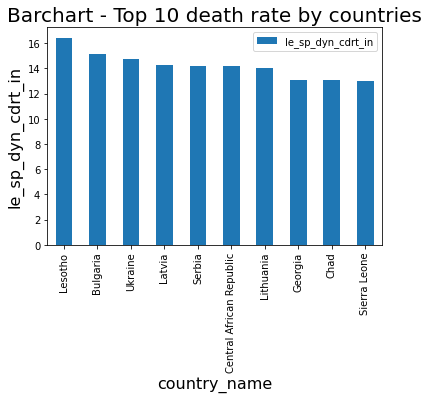

In [ ]:
df[:10].plot.bar()
x=health_df_new.le_sp_dyn_cdrt_in
y=health_df_new.country_name
plt.xlabel('country_name', fontsize=16)
plt.ylabel('le_sp_dyn_cdrt_in', fontsize=16)
plt.title('Barchart - Top 10 death rate by countries',fontsize=20)
plt.show()


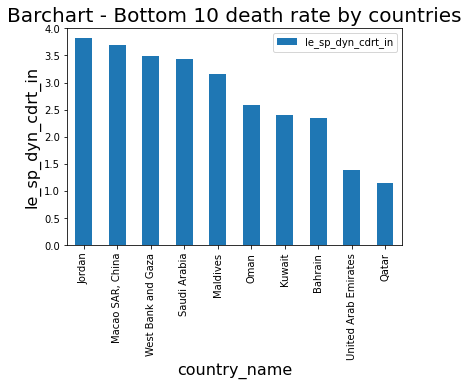

In [ ]:
df[-10:].plot.bar()
x=health_df_new.le_sp_dyn_cdrt_in
y=health_df_new.country_name

plt.xlabel('country_name', fontsize=16)
plt.ylabel('le_sp_dyn_cdrt_in', fontsize=16)
plt.title('Barchart - Bottom 10 death rate by countries',fontsize=20)
plt.show()


**Handling with Missing Values**

First, I will group the countries and then apply interpolation to fill in the missing values. If I don't group the countries before interpolation, one of the values of the country may effect the other country and I don't want it. Thats why I will first group the countries and then apply interpolation. 

In [ ]:
health_df_new.count()

year                 1757
country_name         1757
region               1757
income_group         1757
le_sp_dyn_cdrt_in    1757
onths_sh_imm_meas    1637
onths_sh_imm_idpt    1637
al_sl_tlf_totl_in    1649
sp_dyn_le00_fe_in    1740
sp_dyn_le00_ma_in    1740
rs_sp_dyn_le00_in    1740
hs_sp_dyn_imrt_in    1647
total_sp_pop_totl    1750
ce_sl_uem_totl_zs    1656
on_sp_rur_totl_zs    1750
sp_urb_totl_in_zs    1750
le_sp_dyn_cbrt_in    1757
an_sp_dyn_tfrt_in    1742
ldren_sh_imm_hepb    1541
onths_sh_imm_hib3    1551
ldren_sh_imm_pol3    1637
ts_sp_dyn_amrt_ma    1652
ts_sp_dyn_amrt_fe    1652
eaths_sh_dth_imrt    1647
eaths_sh_dth_nmrt    1647
eaths_sh_dth_mort    1647
on_sh_h2o_basw_zs    1560
on_sh_sta_bass_zs    1549
sp_pop_0014_to_zs    1703
sp_pop_1564_to_zs    1703
sp_pop_65up_to_zs    1703
hs_sp_pop_brth_mf    1710
eople_sh_tbs_mort    1723
ual_%_sp_urb_grow    1750
_%_sp_rur_totl_zg    1706
dtype: int64

In [ ]:
health_df_new.groupby('country_name')

NameError: ignored

In [ ]:
health_df_new

,year,country_name,region,income_group,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
0,2010,Afghanistan,South Asia,Low income,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
1,2011,Afghanistan,South Asia,Low income,7.936,64.000,68.000,7499332.000,63.000,60.190,61.553,61.900,30117413.000,11.488,76.052,23.948,38.750,5.770,68.000,68.000,68.000,266.320,224.280,72161.000,54309.000,97906.000,50.927,35.457,47.702,49.944,2.354,1.060,44.000,4.028,2.866
2,2012,Afghanistan,South Asia,Low income,7.645,59.000,67.000,7891605.000,63.514,60.675,62.054,59.500,31161376.000,11.508,75.840,24.160,37.690,5.562,67.000,67.000,67.000,261.340,219.588,69610.000,52740.000,93956.000,53.532,36.750,47.090,50.524,2.386,1.060,44.000,4.289,3.128
3,2013,Afghanistan,South Asia,Low income,7.380,57.000,64.000,8307325.000,63.999,61.133,62.525,57.300,32269589.000,11.534,75.627,24.373,36.670,5.359,64.000,64.000,62.000,257.135,215.307,67154.000,51219.000,90103.000,56.170,38.056,46.387,51.193,2.420,1.060,43.000,4.372,3.213
4,2014,Afghanistan,South Asia,Low income,7.141,60.000,62.000,8741565.000,64.453,61.563,62.966,55.100,33370794.000,11.448,75.413,24.587,35.706,5.163,62.000,62.000,58.000,252.930,211.026,64808.000,49715.000,86378.000,58.841,39.375,45.641,51.908,2.452,1.060,43.000,4.230,3.072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1815,2014,Zimbabwe,Sub-Saharan Africa,Lower middle income,9.277,92.000,91.000,6486479.000,59.892,56.632,58.410,40.400,13586681.000,5.342,67.496,32.504,34.978,3.974,91.000,91.000,92.000,413.960,359.189,19051.000,11447.000,27058.000,65.473,38.251,42.429,54.693,2.879,1.020,10.000,1.294,1.977
1816,2015,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.673,86.000,87.000,6587744.000,60.984,57.778,59.534,38.500,13814629.000,5.302,67.615,32.385,33.981,3.896,87.000,87.000,88.000,396.789,339.493,18006.000,10815.000,25433.000,64.986,37.568,42.552,54.603,2.844,1.020,7.900,1.297,1.840
1817,2016,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.286,95.000,90.000,6686030.000,61.719,58.565,60.294,36.300,14030390.000,5.253,67.704,32.296,32.864,3.804,90.000,90.000,90.000,379.617,319.797,16693.000,10235.000,23326.000,64.512,36.892,42.665,54.473,2.862,1.020,8.600,1.275,1.681
1818,2017,Zimbabwe,Sub-Saharan Africa,Lower middle income,8.044,90.000,89.000,6792647.000,62.220,59.105,60.812,35.400,14236745.000,5.168,67.763,32.237,31.732,3.707,89.000,89.000,89.000,362.446,300.101,16015.000,9696.000,22519.000,64.051,36.221,42.598,54.506,2.896,1.020,8.300,1.277,1.547


Now I can apply interpolation.

In [ ]:
health_df_new.interpolate(method='linear', inplace=True)

In [ ]:
health_df_new.isnull().sum()

year                 0
country_name         0
region               0
income_group         0
le_sp_dyn_cdrt_in    0
onths_sh_imm_meas    0
onths_sh_imm_idpt    0
al_sl_tlf_totl_in    0
sp_dyn_le00_fe_in    0
sp_dyn_le00_ma_in    0
rs_sp_dyn_le00_in    0
hs_sp_dyn_imrt_in    0
total_sp_pop_totl    0
ce_sl_uem_totl_zs    0
on_sp_rur_totl_zs    0
sp_urb_totl_in_zs    0
le_sp_dyn_cbrt_in    0
an_sp_dyn_tfrt_in    0
ldren_sh_imm_hepb    0
onths_sh_imm_hib3    0
ldren_sh_imm_pol3    0
ts_sp_dyn_amrt_ma    0
ts_sp_dyn_amrt_fe    0
eaths_sh_dth_imrt    0
eaths_sh_dth_nmrt    0
eaths_sh_dth_mort    0
on_sh_h2o_basw_zs    0
on_sh_sta_bass_zs    0
sp_pop_0014_to_zs    0
sp_pop_1564_to_zs    0
sp_pop_65up_to_zs    0
hs_sp_pop_brth_mf    0
eople_sh_tbs_mort    0
ual_%_sp_urb_grow    0
_%_sp_rur_totl_zg    0
dtype: int64

No null values anymore!

Now it's time to select the features and move to Feature Engineering

**FEATURE ENGINEERING**

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sqlalchemy import create_engine
import warnings
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
import statsmodels.api as sm
from statsmodels.tools.eval_measures import mse, rmse

In [ ]:
from sklearn.datasets import load_digits
from sklearn import svm

digits = load_digits()
X = digits.data
y = digits.target

classifier = svm.SVC()
classifier.fit(X[:1000], y[:1000])
predictions = classifier.predict(X[1000:])

Machine learning models can only work with numeric variables. So, I will first create new dataset which doesn't have any categorical value. I will drop year, country_name, region and income_group.

In [ ]:
health_1 = health_df_new.drop(columns=['year', 'country_name', 'region', 'income_group'])
health_1

,le_sp_dyn_cdrt_in,onths_sh_imm_meas,onths_sh_imm_idpt,al_sl_tlf_totl_in,sp_dyn_le00_fe_in,sp_dyn_le00_ma_in,rs_sp_dyn_le00_in,hs_sp_dyn_imrt_in,total_sp_pop_totl,ce_sl_uem_totl_zs,on_sp_rur_totl_zs,sp_urb_totl_in_zs,le_sp_dyn_cbrt_in,an_sp_dyn_tfrt_in,ldren_sh_imm_hepb,onths_sh_imm_hib3,ldren_sh_imm_pol3,ts_sp_dyn_amrt_ma,ts_sp_dyn_amrt_fe,eaths_sh_dth_imrt,eaths_sh_dth_nmrt,eaths_sh_dth_mort,on_sh_h2o_basw_zs,on_sh_sta_bass_zs,sp_pop_0014_to_zs,sp_pop_1564_to_zs,sp_pop_65up_to_zs,hs_sp_pop_brth_mf,eople_sh_tbs_mort,ual_%_sp_urb_grow,_%_sp_rur_totl_zg
0,8.250,62.000,66.000,7173385.000,62.459,59.683,61.028,64.300,29185507.000,11.484,76.263,23.737,39.829,5.977,66.000,66.000,66.000,271.299,228.971,74766.000,55878.000,101882.000,48.356,34.177,48.178,49.494,2.328,1.060,43.000,3.631,2.473
1,7.936,64.000,68.000,7499332.000,63.000,60.190,61.553,61.900,30117413.000,11.488,76.052,23.948,38.750,5.770,68.000,68.000,68.000,266.320,224.280,72161.000,54309.000,97906.000,50.927,35.457,47.702,49.944,2.354,1.060,44.000,4.028,2.866
2,7.645,59.000,67.000,7891605.000,63.514,60.675,62.054,59.500,31161376.000,11.508,75.840,24.160,37.690,5.562,67.000,67.000,67.000,261.340,219.588,69610.000,52740.000,93956.000,53.532,36.750,47.090,50.524,2.386,1.060,44.000,4.289,3.128
3,7.380,57.000,64.000,8307325.000,63.999,61.133,62.525,57.300,32269589.000,11.534,75.627,24.373,36.670,5.359,64.000,64.000,62.000,257.135,215.307,67154.000,51219.000,90103.000,56.170,38.056,46.387,51.193,2.420,1.060,43.000,4.372,3.213
4,7.141,60.000,62.000,8741565.000,64.453,61.563,62.966,55.100,33370794.000,11.448,75.413,24.587,35.706,5.163,62.000,62.000,58.000,252.930,211.026,64808.000,49715.000,86378.000,58.841,39.375,45.641,51.908,2.452,1.060,43.000,4.230,3.072
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1815,9.277,92.000,91.000,6486479.000,59.892,56.632,58.410,40.400,13586681.000,5.342,67.496,32.504,34.978,3.974,91.000,91.000,92.000,413.960,359.189,19051.000,11447.000,27058.000,65.473,38.251,42.429,54.693,2.879,1.020,10.000,1.294,1.977
1816,8.673,86.000,87.000,6587744.000,60.984,57.778,59.534,38.500,13814629.000,5.302,67.615,32.385,33.981,3.896,87.000,87.000,88.000,396.789,339.493,18006.000,10815.000,25433.000,64.986,37.568,42.552,54.603,2.844,1.020,7.900,1.297,1.840
1817,8.286,95.000,90.000,6686030.000,61.719,58.565,60.294,36.300,14030390.000,5.253,67.704,32.296,32.864,3.804,90.000,90.000,90.000,379.617,319.797,16693.000,10235.000,23326.000,64.512,36.892,42.665,54.473,2.862,1.020,8.600,1.275,1.681
1818,8.044,90.000,89.000,6792647.000,62.220,59.105,60.812,35.400,14236745.000,5.168,67.763,32.237,31.732,3.707,89.000,89.000,89.000,362.446,300.101,16015.000,9696.000,22519.000,64.051,36.221,42.598,54.506,2.896,1.020,8.300,1.277,1.547


Let's check skewness and kurtosis.

In [ ]:
from scipy.stats import skew
from scipy.stats import kurtosis
print(skew(health_1['le_sp_dyn_cdrt_in'].dropna()))
print(kurtosis(health_1['le_sp_dyn_cdrt_in'].dropna()))

0.6200207274683878
0.5552889155484935


Skewness: As my score is between 0.5 and 1 my target value is moderately skewed.
Kurtosis:It is between normality range (-1 to 1)

After some more exploration which I will share in the following cells, I decided my features as Mortality Rate, Infant, Population Ages 65 and Above and Life Expectancy at Birth, Male. Also remember that my target value is Death Rate.

Let's see histogram of my features 

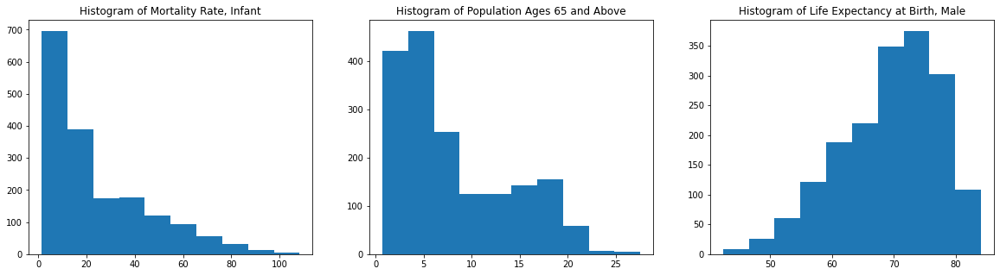

In [ ]:
plt.figure(figsize=(20,5))
plt.subplot(1,3,1)
plt.hist(health_1["hs_sp_dyn_imrt_in"])
plt.title("Histogram of Mortality Rate, Infant")

plt.subplot(1,3,2)
plt.hist(health_1["sp_pop_65up_to_zs"])
plt.title("Histogram of Population Ages 65 and Above")

plt.subplot(1,3,3)
plt.hist(health_1["sp_dyn_le00_ma_in"])
plt.title("Histogram of Life Expectancy at Birth, Male")

plt.show()




It doesn't look normally distributed. I wish they did... 

But features don't have to distribute normally. It's not a vitally important. 

Nevertheless, I will do something for normal distribution.

Winsorization of Features;

In [ ]:
winsorized_hs_sp_dyn_imrt_in = winsorize(health_1["hs_sp_dyn_imrt_in"], (0, 0.10))
winsorized_hs_sp_dyn_imrt_in

masked_array(data=[57.4, 57.4, 57.4, ..., 36.3, 35.4, 33.9],
             mask=False,
       fill_value=1e+20)

In [ ]:
winsorized_sp_pop_65up_to_zs = winsorize(health_1["sp_pop_65up_to_zs"], (0, 0.10))
winsorized_sp_pop_65up_to_zs

masked_array(data=[2.32813156, 2.35446185, 2.38629385, ..., 2.86177853,
                   2.89619112, 2.93952365],
             mask=False,
       fill_value=1e+20)

In [ ]:
winsorized_sp_dyn_le00_ma_in = winsorize(health_1["sp_dyn_le00_ma_in"], (0, 0.10))
winsorized_sp_dyn_le00_ma_in

masked_array(data=[59.683, 60.19 , 60.675, ..., 58.565, 59.105, 59.501],
             mask=False,
       fill_value=1e+20)

Text(0.5, 1.0, 'Histogram of Life Expectancy at Birth, Male')

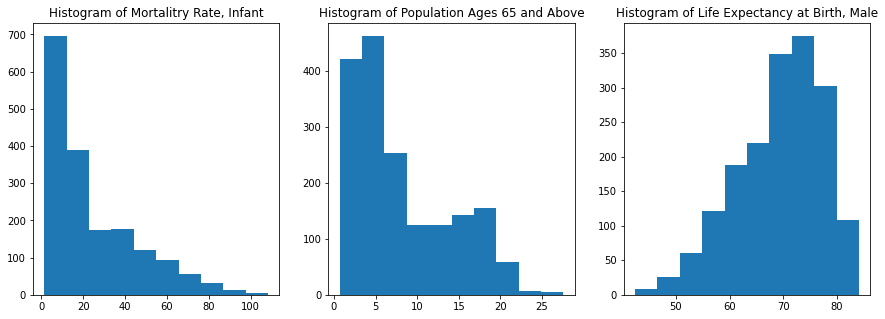

In [ ]:
plt.figure(figsize=(15,5))

# histograms of the original data
plt.subplot(1, 3, 1)
plt.hist(health_1["hs_sp_dyn_imrt_in"])
plt.title("Histogram of Mortalitry Rate, Infant")

plt.subplot(1, 3, 2)
plt.hist(health_1["sp_pop_65up_to_zs"])
plt.title("Histogram of Population Ages 65 and Above")

plt.subplot(1, 3, 3)
plt.hist(health_1["sp_dyn_le00_ma_in"])
plt.title("Histogram of Life Expectancy at Birth, Male")



Log transformation for features

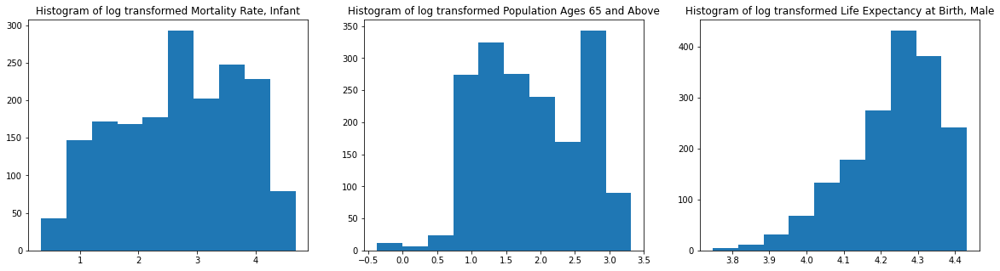

In [ ]:
plt.figure(figsize = (20,5))

plt.subplot(1,3,1)
plt.hist(np.log(health_1["hs_sp_dyn_imrt_in"]))
plt.title("Histogram of log transformed Mortality Rate, Infant")


plt.subplot(1,3,2)
plt.hist(np.log(health_1["sp_pop_65up_to_zs"]))
plt.title("Histogram of log transformed Population Ages 65 and Above")


plt.subplot(1,3,3)
plt.hist(np.log(health_1["sp_dyn_le00_ma_in"]))
plt.title("Histogram of log transformed Life Expectancy at Birth, Male")
plt.show()



In [ ]:
from scipy.stats import jarque_bera
from scipy.stats import normaltest

jb_stats = jarque_bera(np.log(health_1["hs_sp_dyn_imrt_in"]))
norm_stats = normaltest(np.log(health_1["hs_sp_dyn_imrt_in"]))

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

jb_stats = jarque_bera(np.log(health_1["sp_pop_65up_to_zs"]))
norm_stats = normaltest(np.log(health_1["sp_pop_65up_to_zs"]))

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

jb_stats = jarque_bera(np.log(health_1["sp_dyn_le00_ma_in"]))
norm_stats = normaltest(np.log(health_1["sp_dyn_le00_ma_in"]))

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

Jarque-Bera test statistics is 88.13139081514282 and p value is 0.0
Normality test statistics is 441.8469204730895 and p value is 1.1328184046676369e-96
Jarque-Bera test statistics is 62.5478942098633 and p value is 2.6201263381153694e-14
Normality test statistics is 263.09797064915324 and p value is 7.39607954849889e-58
Jarque-Bera test statistics is 238.97975012929777 and p value is 0.0
Normality test statistics is 181.87146320142693 and p value is 3.2145009465056865e-40


The p-values are 0 -or very close to 0- which indicates that the distribution of the log transformed variables is statistically different from the normal distribution.

Another common method to make variables normally distributed is the Box-Cox transformation. Now I will apply Box-Cox transformation to my features

Text(0.5, 1.0, 'histogram of Life Expectancy at Birth, Male (box-cox transformed)')

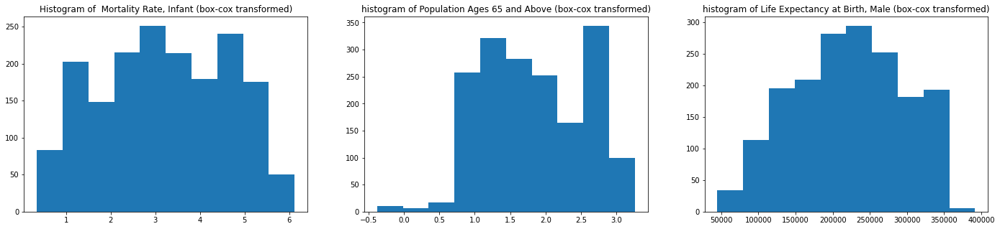

In [ ]:
from scipy.stats import boxcox

hs_sp_dyn_imrt_in_boxcox,_ = boxcox(health_1["hs_sp_dyn_imrt_in"])
sp_pop_65up_to_zs_boxcox,_ = boxcox(health_1["sp_pop_65up_to_zs"])
sp_dyn_le00_ma_in_boxcox,_ = boxcox(health_1["sp_dyn_le00_ma_in"])

plt.figure(figsize=(24,5))

# histograms of the box-cox transformed data
plt.subplot(1, 3, 1)
plt.hist(hs_sp_dyn_imrt_in_boxcox)
plt.title("Histogram of  Mortality Rate, Infant (box-cox transformed)")

plt.subplot(1, 3, 2)
plt.hist(sp_pop_65up_to_zs_boxcox)
plt.title("histogram of Population Ages 65 and Above (box-cox transformed)")

plt.subplot(1, 3, 3)
plt.hist(sp_dyn_le00_ma_in_boxcox)
plt.title("histogram of Life Expectancy at Birth, Male (box-cox transformed)")


It looks better but still not quite normally distributed. We can confirm this using the Jargue-Bera and Normal tests:

In [ ]:
from scipy.stats import jarque_bera
from scipy.stats import normaltest

jb_stats = jarque_bera(hs_sp_dyn_imrt_in_boxcox)
norm_stats = normaltest(hs_sp_dyn_imrt_in_boxcox)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

jb_stats = jarque_bera(sp_pop_65up_to_zs_boxcox)
norm_stats = normaltest(sp_pop_65up_to_zs_boxcox)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

jb_stats = jarque_bera(sp_dyn_le00_ma_in_boxcox)
norm_stats = normaltest(sp_dyn_le00_ma_in_boxcox)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

Jarque-Bera test statistics is 83.83910103165387 and p value is 0.0
Normality test statistics is 559.9941435837608 and p value is 2.5050521517780744e-122
Jarque-Bera test statistics is 60.518945931574066 and p value is 7.216449660063518e-14
Normality test statistics is 244.7983469955318 and p value is 6.9616848688837e-54
Jarque-Bera test statistics is 56.12412580391713 and p value is 6.498135363131041e-13
Normality test statistics is 184.1310557562985 and p value is 1.0386022736895004e-40


Again, p values are either 0 or very close to 0.

Let's see scatterplot of features one by one.

Text(0.5, 0.98, 'x=Death Rate, y= Mortality Rate, Infant')

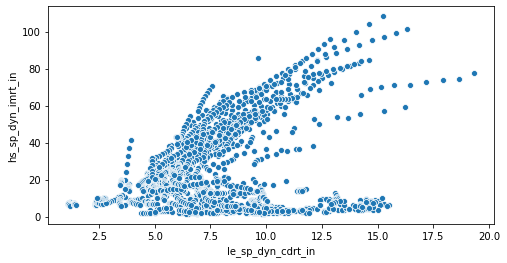

In [ ]:
plt.figure(figsize = (8,4))
sns.scatterplot(x="le_sp_dyn_cdrt_in", y="hs_sp_dyn_imrt_in", data=health_1)
fig.suptitle("x=Death Rate, y= Mortality Rate, Infant", fontsize=12)

Text(0.5, 0.98, 'x=Death Rate, y=Population Ages 65 and Above')

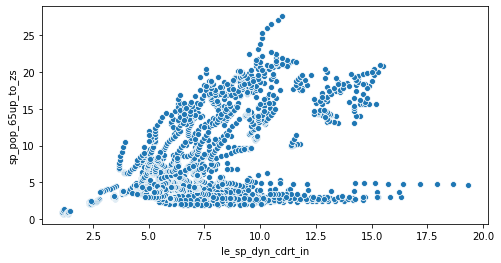

In [ ]:
plt.figure(figsize = (8,4))
sns.scatterplot(x="le_sp_dyn_cdrt_in", y="sp_pop_65up_to_zs", data=health_1)
fig.suptitle("x=Death Rate, y=Population Ages 65 and Above", fontsize=12)

Text(0.5, 0.98, 'x=Death Rate, y=Life Expectancy at Birth, Male')

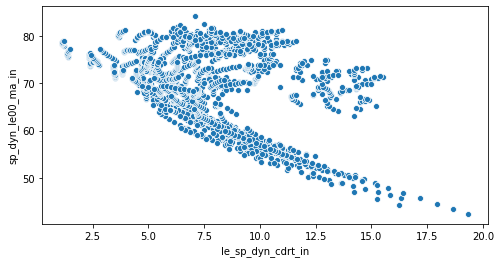

In [ ]:
plt.figure(figsize = (8,4))
sns.scatterplot(x="le_sp_dyn_cdrt_in", y="sp_dyn_le00_ma_in", data=health_1)
fig.suptitle("x=Death Rate, y=Life Expectancy at Birth, Male", fontsize=12)

Now I will standardize my variables to exhibit some regular statistical patterns. 

Normalize the data so that all variables have a mean of 0 and standard deviation
of 1.

In [ ]:
Y = health_1['le_sp_dyn_cdrt_in']
X = StandardScaler().fit_transform(health_1.dropna())

The NumPy covariance function assumes that variables are represented by rows,
not columns, so we transpose X.

In [ ]:
Xt = X.T
Cx = np.cov(Xt)
print('Covariance Matrix:\n', Cx)

Covariance Matrix:
 [[ 1.00056948e+00 -2.23067529e-01 -2.31656757e-01 -1.69326598e-02
  -2.99499790e-01 -3.83197337e-01 -3.41955573e-01  2.64707876e-01
  -1.62254498e-02  2.37394555e-01  1.64528933e-01 -1.64528933e-01
   3.94684116e-02  1.06217303e-01 -2.43175887e-01 -2.31284189e-01
  -2.29342403e-01  4.66258415e-01  3.91533781e-01  6.36228805e-02
   2.86340821e-02  8.45801527e-02 -2.35130104e-01 -2.01770400e-01
  -2.79863836e-02 -2.88314824e-01  3.91341945e-01 -7.93996599e-02
   2.42571808e-01 -2.57496172e-01 -1.52229057e-01]
 [-2.23067529e-01  1.00056948e+00  9.14190203e-01  4.40102556e-02
   5.48496438e-01  5.12011991e-01  5.35079414e-01 -6.50494151e-01
   2.07993493e-02  4.64347984e-02 -3.02856671e-01  3.02856671e-01
  -5.40411210e-01 -5.82917448e-01  7.88582348e-01  7.49944423e-01
   9.18122312e-01 -4.11412574e-01 -5.13468520e-01 -2.22332600e-01
  -1.81820670e-01 -2.48696498e-01  5.38523684e-01  5.17658636e-01
  -5.45168192e-01  5.50205489e-01  3.50356154e-01  1.99303928e-01
  -4.

Now, let's move to models.

**MODELING**

**SIMPLE LINEAR REGRESSION with OLS**

Y = our target value (death rate)
X = Mortality Rate Adult, Male (ts_sp_dyn_amrt_ma) & Life Expectancy at Birth, Male -year- (sp_dyn_le00_ma_in)

In [ ]:
lrm = linear_model.LinearRegression()
# fit method estimates the coefficients using OLS
lrm.fit(X, Y)
# Inspect the results.
print('\nCoefficients: \n', lrm.coef_)
print('\nIntercept: \n', lrm.intercept_)


Coefficients: 
 [ 2.77808286e+00  1.85703658e-16  6.43292552e-16  1.02938507e-16
  3.85183919e-16  3.26356989e-16 -2.92110685e-15 -3.02192868e-16
  1.15053946e-16  9.25187725e-16  4.35679968e-16 -5.17721283e-16
  8.05126239e-16 -1.22785984e-15  7.91335650e-16  5.02692800e-16
  7.65336738e-16  1.73425347e-16  3.22868624e-16  1.26317330e-15
 -1.62818427e-15 -7.42425151e-16  3.01647331e-16  1.23780910e-16
 -1.34309626e-09 -8.64208754e-10 -7.32742402e-10 -1.51539610e-16
  6.80129199e-17 -4.39217608e-16 -3.30374884e-16]

Intercept: 
 7.7977867577307896


In [ ]:
predictions = lrm.predict(X)
errors = Y - predictions
print("Mean of the errors in the model is: {}".format(np.mean(errors)))

Mean of the errors in the model is: 9.398666629638349e-16


We need to manually add a constant in statsmodels' sm

In [ ]:
import statsmodels.api as sm
X = sm.add_constant(X)

results = sm.OLS(Y, X).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      le_sp_dyn_cdrt_in   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 2.663e+15
Date:                Sat, 01 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:19:01   Log-Likelihood:                 23355.
No. Observations:                1757   AIC:                        -4.665e+04
Df Residuals:                    1726   BIC:                        -4.648e+04
Df Model:                          30                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          7.7978   9.83e-09   7.93e+08      0.000       7.798       7.798
x1             2.7781   3.34e-08   8.31e+07      0.000       2.778       2.778
x2           2.03e-16   2.79e-08   7.27e-09      1.000   -5.48e-08    5.48e-08
x3         -2.359e-16   4.76e-08  -4.96e-09      1.000   -9.34e-08    9.34e-08
x4          1.755e-15   8.93e-08   1.97e-08      1.000   -1.75e-07    1.75e-07
x5         -1.349e-14   6.13e-07   -2.2e-08      1.000    -1.2e-06     1.2e-06
x6         -1.144e-14   5.94e-07  -1.93e-08      1.000   -1.16e-06    1.16e-06
x7          3.486e-14   1.18e-06   2.95e-08      1.000   -2.32e-06    2.32e-06
x8          9.368e-16   3.19e-08   2.93e-08      1.000   -6.26e-08    6.26e-08
x9         -3.657e-15   1.05e-07  -3.47e-08      1.000   -2.07e-07    2.07e-07
x10         1.249e-16   1.15e-08   1.09e-08      1.000   -2.26e-08    2.26e-08
x11         -9.52e-15   3.13e-07  -3.04e-08      1.000   -6.14e-07    6.14e-07
x12         2.581e-15   3.12e-07   8.26e-09      1.000   -6.13e-07    6.13e-07
x13         2.966e-16    8.7e-08   3.41e-09      1.000   -1.71e-07    1.71e-07
x14         3.773e-15   6.88e-08   5.49e-08      1.000   -1.35e-07    1.35e-07
x15        -9.333e-16   2.05e-08  -4.56e-08      1.000   -4.02e-08    4.02e-08
x16        -8.531e-16   1.87e-08  -4.56e-08      1.000   -3.67e-08    3.67e-08
x17          2.33e-15   4.36e-08   5.34e-08      1.000   -8.56e-08    8.56e-08
x18         6.176e-16   5.67e-08   1.09e-08      1.000   -1.11e-07    1.11e-07
x19         -1.86e-15   6.24e-08  -2.98e-08      1.000   -1.22e-07    1.22e-07
x20        -1.471e-15    2.8e-07  -5.25e-09      1.000   -5.49e-07    5.49e-07
x21          1.01e-15   1.13e-07   8.94e-09      1.000   -2.22e-07    2.22e-07
x22         2.415e-15    1.9e-07   1.27e-08      1.000   -3.72e-07    3.72e-07
x23         4.302e-16   2.64e-08   1.63e-08      1.000   -5.18e-08    5.18e-08
x24         1.066e-15   2.64e-08   4.04e-08      1.000   -5.18e-08    5.18e-08
x25        -1.285e-07     23.766  -5.41e-09      1.000     -46.614      46.614
x26        -4.284e-07     15.292   -2.8e-08      1.000     -29.993      29.993
x27        -1.877e-07     12.966  -1.45e-08      1.000     -25.431      25.431
x28         6.683e-16   1.34e-08   4.97e-08      1.000   -2.64e-08    2.64e-08
x29         3.348e-16   1.57e-08   2.13e-08      1.000   -3.09e-08    3.09e-08
x30        -1.041e-16   1.74e-08     -6e-09      1.000    -3.4e-08     3.4e-08
x31        -5.334e-17   1.47e-08  -3.63e-09      1.000   -2.88e-08    2.88e-08
==============================================================================
Omnibus:                      132.962   Durbin-Watson:                   0.177
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               83.823
Skew:                          -0.408   Prob(JB):                     6.28e-19
Ku

Now define Standart Scaler and then transform data

In [ ]:
print(health_1)
scaler = StandardScaler()
scaled = scaler.fit_transform(health_1)
print(scaled)

      le_sp_dyn_cdrt_in  ...  _%_sp_rur_totl_zg
0                 8.250  ...              2.473
1                 7.936  ...              2.866
2                 7.645  ...              3.128
3                 7.380  ...              3.213
4                 7.141  ...              3.072
...                 ...  ...                ...
1815              9.277  ...              1.977
1816              8.673  ...              1.840
1817              8.286  ...              1.681
1818              8.044  ...              1.547
1819              7.883  ...              1.452

[1757 rows x 31 columns]
[[ 0.16277889 -1.96400402 -1.62107348 ...  1.45084726  0.9296633
   1.37866897]
 [ 0.0497513  -1.81049215 -1.47443344 ...  1.50014529  1.15355731
   1.63200128]
 [-0.05499719 -2.19427183 -1.54775346 ...  1.50014529  1.30060481
   1.80105728]
 ...
 [ 0.17573747  0.56894192  0.13860697 ... -0.24500488 -0.39876648
   0.86861474]
 [ 0.08862703  0.18516223  0.06528695 ... -0.25979429 -0.39728152
   0

In [ ]:
Xt = X.T
Cx = np.cov(Xt)
print('Covariance Matrix:\n', Cx)

Covariance Matrix:
 [[ 0.          0.          0.         ...  0.          0.
   0.        ]
 [ 0.          1.00056948 -0.22306753 ...  0.24257181 -0.25749617
  -0.15222906]
 [ 0.         -0.22306753  1.00056948 ... -0.49064291 -0.3005085
  -0.27973486]
 ...
 [ 0.          0.24257181 -0.49064291 ...  1.00056948  0.44054925
   0.29890388]
 [ 0.         -0.25749617 -0.3005085  ...  0.44054925  1.00056948
   0.52671988]
 [ 0.         -0.15222906 -0.27973486 ...  0.29890388  0.52671988
   1.00056948]]


Calculating and inspecting the eigenvalues and eigenvectors 

In [ ]:
# Calculating eigenvalues and eigenvectors.

eig_val_cov, eig_vec_cov = np.linalg.eig(Cx)

# Inspecting the eigenvalues and eigenvectors.
for i in range(len(eig_val_cov)):
    eigvec_cov = eig_vec_cov[:, i].T
    print('Eigenvector {}: \n{}'.format(i + 1, eigvec_cov))
    print('Eigenvalue {}: {}'.format(i + 1, eig_val_cov[i]))
    print(40 * '-')

print(
    'The percentage of total variance in the dataset explained by each',
    'component calculated by hand.\n',
    eig_val_cov / sum(eig_val_cov)
)

Eigenvector 1: 
[ 0.          0.06280308 -0.18102203 -0.17492922 -0.00179085 -0.24649937
 -0.23877091 -0.24453764  0.24280136  0.00844213 -0.03480948  0.16730815
 -0.16730815  0.24080666  0.2381187  -0.13712522 -0.14797719 -0.18179003
  0.20984398  0.23273533  0.08530021  0.07235278  0.0920693  -0.22920865
 -0.22850494  0.23511314 -0.21194688 -0.180982   -0.10480168  0.19041134
  0.15826316  0.14585873]
Eigenvalue 1: 14.763712399041022
----------------------------------------
Eigenvector 2: 
[ 0.          0.00461426 -0.0516091  -0.06734979  0.38813225  0.03911276
  0.04897426  0.04398115 -0.0054827   0.42816076 -0.05376768 -0.00778942
  0.00778942 -0.06522059 -0.05621273 -0.09411728 -0.13230872 -0.06394983
 -0.06556363 -0.06173693  0.4247638   0.43093712  0.41212955  0.05289325
  0.02192231 -0.06122781  0.0593856   0.04218846  0.2269774   0.02154199
 -0.01586887 -0.05812866]
Eigenvalue 2: 4.200691392286238
----------------------------------------
Eigenvector 3: 
[ 0.          0.2229965

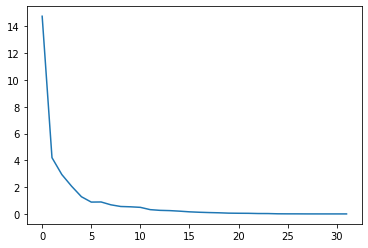

[ 1.47637124e+01  4.20069139e+00  2.94279927e+00  2.06577874e+00
  1.28323499e+00  8.83328143e-01  8.92375281e-01  6.79875864e-01
  5.54526756e-01  5.30895160e-01  4.90466776e-01  3.19823798e-01
  2.66173835e-01  2.46488269e-01  2.05709756e-01  1.55795905e-01
  1.24117031e-01  1.01211068e-01  8.38045978e-02  5.74480315e-02
  4.91492262e-02  4.51796515e-02  2.89812071e-02  2.68325855e-02
  8.94533028e-03  5.11785769e-03  4.35212944e-03  7.92799739e-04
  4.59104599e-05 -2.07041256e-16 -2.95831540e-17  0.00000000e+00]


In [ ]:
plt.plot(eig_val_cov)
plt.show()

print(eig_val_cov)

Both the scree plot and the eigenvalues >1 rule agree that we should keep only the 1st 5 components.
Ultimately we have a solution that encompasses over 84% of the data's variance in just 5 components, rather than 31 variables.

Now I will try some feature combinations to find the best one to explain my model.

Let's try with Mortality rate, male and Life expectancy at birth, male

In [ ]:
# Y is the target variable (death rate)
Y = health_1['le_sp_dyn_cdrt_in']
# X is the feature set
X = health_1[['ts_sp_dyn_amrt_ma','sp_dyn_le00_ma_in']]

# We create a LinearRegression model object
# from scikit-learn's linear_model module.
lrm = linear_model.LinearRegression()

# fit method estimates the coefficients using OLS
lrm.fit(X, Y)

# Inspect the results.
print('\nCoefficients: \n', lrm.coef_)
print('\nIntercept: \n', lrm.intercept_)


Coefficients: 
 [0.0203938  0.09327214]

Intercept: 
 -2.6398882642737416


death rate =  -2.63 + 0.02 ts_sp_dyn_amrt_ma (mortality rate male) + 0.09 sp_dyn_le00_ma_in (Life expectancy at birth, male)

Let's check mean of the error by taking the difference between the measured value and true/correct value.

In [ ]:
predictions = lrm.predict(X)
errors = Y - predictions

print("Mean of the errors in the model is: {}".format(np.mean(errors)))

Mean of the errors in the model is: 2.6286441561984354e-17


This very low score shows that measured and true values are so close to each other on average

Let's train the model

In [ ]:
import statsmodels.api as sm

# We need to manually add a constant
# in statsmodels' sm
X = sm.add_constant(X)

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

results = sm.OLS(Y, X).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      le_sp_dyn_cdrt_in   R-squared:                       0.229
Model:                            OLS   Adj. R-squared:                  0.228
Method:                 Least Squares   F-statistic:                     260.1
Date:                Sat, 01 Aug 2020   Prob (F-statistic):           1.22e-99
Time:                        23:19:37   Log-Likelihood:                -4060.2
No. Observations:                1757   AIC:                             8126.
Df Residuals:                    1754   BIC:                             8143.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -2.6399      1.532     -1.723      0.085      -5.645       0.366
ts_sp_dyn_amrt_ma     0.0204      0.001     13.660      0.000       0.017       0.023
sp_dyn_le00_ma_in     0.0933      0.018      5.129      0.000       0.058       0.129
==============================================================================
Omnibus:                      108.368   Durbin-Watson:                   0.268
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              128.358
Skew:                           0.662   Prob(JB):                     1.34e-28
Kurtosis:                       3.010   Cond. No.                     5.93e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.93e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

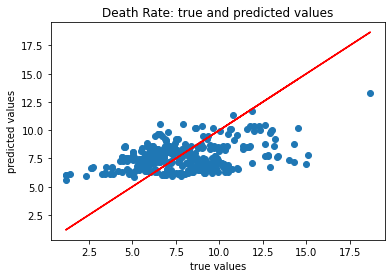

Mean absolute error of the prediction is: 1.9265251617119694
Mean squared error of the prediction is: 5.568566126304831
Root mean squared error of the prediction is: 2.359780948796907
Mean absolute percentage error of the prediction is: 30.593724096930085


In [ ]:
# We add constant to the model as it's a best practice
# to do so every time!
X_test = sm.add_constant(X_test)
# We are making predictions here
y_preds = results.predict(X_test)
plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

print("Mean absolute error of the prediction is: {}".format(mean_absolute_error(y_test, y_preds)))
print("Mean squared error of the prediction is: {}".format(mse(y_test, y_preds)))
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

It's not satisfying at all. Let's try another variable now.

New features are Mortality rate, male and Mortality rate, infant

In [ ]:
# Y is the target variable, in other words what are trying to predict.
Y = health_1['le_sp_dyn_cdrt_in']

# X is the feature set
X = health_1[['ts_sp_dyn_amrt_ma','hs_sp_dyn_imrt_in']]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

print("The number of observations in the training set is {}".format(X_train.shape[0]))
print("The number of observations in the test set is {}".format(X_test.shape[0]))

# We add constant to the model as it's a best practice
# to do so every time!
X_train = sm.add_constant(X_train)

# We fit an OLS model using statsmodels
results = sm.OLS(y_train, X_train).fit()

# We print the summary results
print(results.summary())


The number of observations in the training set is 1405
The number of observations in the test set is 352
                            OLS Regression Results                            
Dep. Variable:      le_sp_dyn_cdrt_in   R-squared:                       0.247
Model:                            OLS   Adj. R-squared:                  0.246
Method:                 Least Squares   F-statistic:                     230.5
Date:                Sat, 01 Aug 2020   Prob (F-statistic):           2.90e-87
Time:                        23:19:48   Log-Likelihood:                -3255.0
No. Observations:                1405   AIC:                             6516.
Df Residuals:                    1402   BIC:                             6532.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------

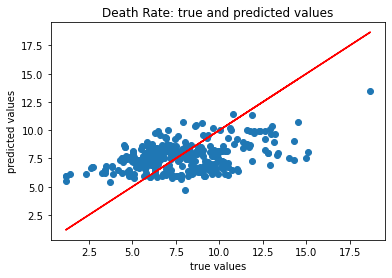

Mean absolute error of the prediction is: 1.9418181272048776
Mean squared error of the prediction is: 5.519261908650119
Root mean squared error of the prediction is: 2.3493109433725707
Mean absolute percentage error of the prediction is: 30.76511979557715


In [ ]:
# We add constant to the model as it's a best practice
# to do so every time!
X_test = sm.add_constant(X_test)

# We are making predictions here
y_preds = results.predict(X_test)

plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

print("Mean absolute error of the prediction is: {}".format(mean_absolute_error(y_test, y_preds)))
print("Mean squared error of the prediction is: {}".format(mse(y_test, y_preds)))
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

Both model has very low and almost same R-squared. So, let's change fetaures and try to find better ones.

Let's try 'sp_pop_65up_to_zs' (Population ages 65 and above), & 'hs_sp_dyn_imrt_in' (Mortality rate, infant)

In [ ]:
# Y is the target variable, in other words what are trying to predict.
Y = health_1['le_sp_dyn_cdrt_in']
# X is the feature set
X = health_1[['sp_pop_65up_to_zs', 'hs_sp_dyn_imrt_in']]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

print("The number of observations in the training set is {}".format(X_train.shape[0]))
print("The number of observations in the test set is {}".format(X_test.shape[0]))

# We add constant to the model as it's a best practice
# to do so every time!
X_train = sm.add_constant(X_train)
# We fit an OLS model using statsmodels
results = sm.OLS(y_train, X_train).fit()
# We print the summary results
print(results.summary())


The number of observations in the training set is 1405
The number of observations in the test set is 352
                            OLS Regression Results                            
Dep. Variable:      le_sp_dyn_cdrt_in   R-squared:                       0.612
Model:                            OLS   Adj. R-squared:                  0.611
Method:                 Least Squares   F-statistic:                     1104.
Date:                Sat, 01 Aug 2020   Prob (F-statistic):          1.08e-288
Time:                        23:19:58   Log-Likelihood:                -2790.2
No. Observations:                1405   AIC:                             5586.
Df Residuals:                    1402   BIC:                             5602.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------

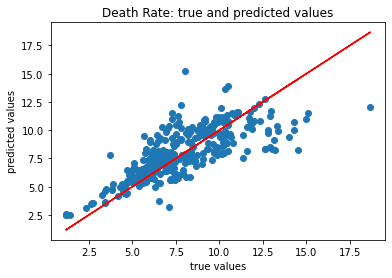

Mean absolute error of the prediction is: 1.266611836804391
Mean squared error of the prediction is: 2.9219026827562002
Root mean squared error of the prediction is: 1.7093573888324818
Mean absolute percentage error of the prediction is: 17.38262506799241


In [ ]:
# We add constant to the model as it's a best practice
# to do so every time!
X_test = sm.add_constant(X_test)

# We are making predictions here
y_preds = results.predict(X_test)
plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

print("Mean absolute error of the prediction is: {}".format(mean_absolute_error(y_test, y_preds)))
print("Mean squared error of the prediction is: {}".format(mse(y_test, y_preds)))
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

When I include 'population ages 65 and above' to my model, R-squared rised up dramatically. So population ages 65 and above looks better feature to explain my model. But still I can find better. Let's go on to look for better.

Let's change the features as 'sp_pop_65up_to_zs' (Population ages 65 and above) and 'ts_sp_dyn_amrt_ma' (Mortality rate, male). Remember that I keep Y stable as death rate.

In [ ]:
# Y is the target variable, in other words what are trying to predict.
Y = health_1['le_sp_dyn_cdrt_in']
# X is the feature set
X = health_1[['sp_pop_65up_to_zs', 'sp_dyn_le00_ma_in']]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

print("The number of observations in the training set is {}".format(X_train.shape[0]))
print("The number of observations in the test set is {}".format(X_test.shape[0]))

# We add constant to the model as it's a best practice
# to do so every time!
X_train = sm.add_constant(X_train)
# We fit an OLS model using statsmodels
results = sm.OLS(y_train, X_train).fit()
# We print the summary results
print(results.summary())

The number of observations in the training set is 1405
The number of observations in the test set is 352
                            OLS Regression Results                            
Dep. Variable:      le_sp_dyn_cdrt_in   R-squared:                       0.839
Model:                            OLS   Adj. R-squared:                  0.839
Method:                 Least Squares   F-statistic:                     3660.
Date:                Sat, 01 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:20:06   Log-Likelihood:                -2170.6
No. Observations:                1405   AIC:                             4347.
Df Residuals:                    1402   BIC:                             4363.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------

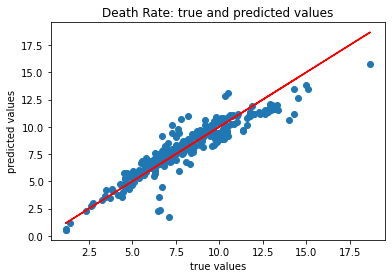

Mean absolute error of the prediction is: 0.6719440070172836
Mean squared error of the prediction is: 0.9165649268532857
Root mean squared error of the prediction is: 0.9573739743973019
Mean absolute percentage error of the prediction is: 9.1522319074468


In [ ]:
# We add constant to the model as it's a best practice
# to do so every time!
X_test = sm.add_constant(X_test)

# We are making predictions here
y_preds = results.predict(X_test)

plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

print("Mean absolute error of the prediction is: {}".format(mean_absolute_error(y_test, y_preds)))
print("Mean squared error of the prediction is: {}".format(mse(y_test, y_preds)))
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

Woow, it's very impressive! Now I have the best R-squared 0.84. Plus, the test set performance of the last model is better than the previous ones with respect to all of the four metrics I use. Perfect! Lastly, let's try to combine 3 features which are;

'sp_pop_65up_to_zs' (Population ages 65 and above)

'ts_sp_dyn_amrt_ma' (Mortality rate, male)

'hs_sp_dyn_imrt_in' (Mortality rate, infant)

In [ ]:
# Y is the target variable, in other words what are trying to predict.
Y = health_1['le_sp_dyn_cdrt_in']

# X is the feature set
X = health_1[['sp_pop_65up_to_zs', 'sp_dyn_le00_ma_in', 'hs_sp_dyn_imrt_in']]

X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

print("The number of observations in the training set is {}".format(X_train.shape[0]))
print("The number of observations in the test set is {}".format(X_test.shape[0]))

# We add constant to the model as it's a best practice
# to do so every time!
X_train = sm.add_constant(X_train)

# We fit an OLS model using statsmodels
results = sm.OLS(y_train, X_train).fit()

# We print the summary results
print(results.summary())

The number of observations in the training set is 1405
The number of observations in the test set is 352
                            OLS Regression Results                            
Dep. Variable:      le_sp_dyn_cdrt_in   R-squared:                       0.842
Model:                            OLS   Adj. R-squared:                  0.842
Method:                 Least Squares   F-statistic:                     2497.
Date:                Sat, 01 Aug 2020   Prob (F-statistic):               0.00
Time:                        23:20:14   Log-Likelihood:                -2156.6
No. Observations:                1405   AIC:                             4321.
Df Residuals:                    1401   BIC:                             4342.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------

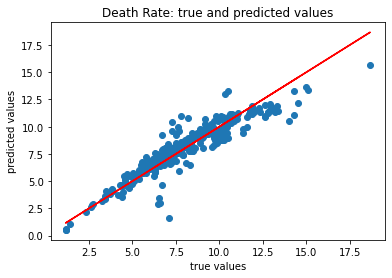

Mean absolute error of the prediction is: 0.6764980259061517
Mean squared error of the prediction is: 0.9374978337039945
Root mean squared error of the prediction is: 0.968244717880761
Mean absolute percentage error of the prediction is: 9.141042714834793


In [ ]:
# We add constant to the model as it's a best practice
# to do so every time!
X_test = sm.add_constant(X_test)

# We are making predictions here
y_preds = results.predict(X_test)

plt.scatter(y_test, y_preds)
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

print("Mean absolute error of the prediction is: {}".format(mean_absolute_error(y_test, y_preds)))
print("Mean squared error of the prediction is: {}".format(mse(y_test, y_preds)))
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds) / y_test)) * 100))

I finally found the best features to explain my model. I will move 3 features. Because more features mean less risk and always better to explain the model. Could I add more fetaures to my model? Yes I definitely could. But it's my model and I think that there are limitless combination and for the sake of the project timing I preferred to move with those features which satisfied me a lot in terms of results.

In [ ]:
# Y is the target variable
Y = health_1['le_sp_dyn_cdrt_in']
# X is the feature set which includes
# is_male and is_smoker variables
X = health_1[['sp_pop_65up_to_zs', 'sp_dyn_le00_ma_in', 'hs_sp_dyn_imrt_in']]

# We create a LinearRegression model object
# from scikit-learn's linear_model module.
lrm = linear_model.LinearRegression()

# fit method estimates the coefficients using OLS
lrm.fit(X, Y)

# Inspect the results.
print('\nCoefficients: \n', lrm.coef_)
print('\nIntercept: \n', lrm.intercept_)


Coefficients: 
 [ 0.53264234 -0.35403727  0.01230111]

Intercept: 
 27.668217867878106


death rate = 27.67 + 0.53 * 'sp_pop_65up_to_zs' (Population ages 65 and above) - 0.35 * 'sp_dyn_le00_ma_in' (Life expectancy at birth, male) + 0.01 'hs_sp_dyn_imrt_in' (Mortality rate, infant)

In [ ]:
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

In [ ]:
y_pred = lrm.predict(X_test)
y_pred


array([ 6.48570753, 11.09696756,  7.61869242,  9.66523323,  5.99217002,
        9.38590002,  4.5958584 ,  5.47004997,  9.72198908, 10.92997704,
        3.75873214,  4.63757769,  7.4882944 , 10.32407393, 11.75003588,
        9.95838229,  9.69084972,  6.66510768,  6.07446137, 11.38986376,
       10.71985167,  7.81793   ,  6.6892892 ,  6.74179152,  5.41518682,
        6.61399663,  5.85400309,  7.6526012 ,  9.11585538,  8.61224531,
        8.92862709,  6.51377127,  6.49059422,  5.54270165,  5.71642266,
        6.86309258,  7.47404114, 10.44427821,  4.58165473,  6.66967449,
       10.86887066,  7.77451019, 11.14168119,  8.7669503 , 10.82219535,
        6.37949156,  7.81646082,  8.10049506,  8.69489102,  9.34381146,
        9.25698778,  0.55395152,  6.75127376,  6.66157491,  9.42529416,
        0.50710443, 10.03654769,  4.53889831,  5.6620029 ,  3.68938867,
        7.02160911,  6.87141041,  8.145078  ,  9.55295973,  9.14273632,
       10.48089638, 11.06870371,  8.58536897,  9.9422778 ,  4.12

**Overfitting Check**

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

print("The number of observations in training set is {}".format(X_train.shape[0]))
print("The number of observations in test set is {}".format(X_test.shape[0]))

# We fit an OLS model using sklearn
lrm = LinearRegression()
lrm.fit(X_train, y_train)
# We are making predictions here
y_preds_train = lrm.predict(X_train)
y_preds_test = lrm.predict(X_test)

print("R-squared of the model in the training set is: {}".format(lrm.score(X_train, y_train)))
print("-----Test set statistics-----")
print("R-squared of the model in the test set is: {}".format(lrm.score(X_test, y_test)))
print("Mean absolute error of the prediction is: {}".format(mean_absolute_error(y_test, y_preds_test)))
print("Mean squared error of the prediction is: {}".format(mse(y_test, y_preds_test)))
print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test)))
print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100))

The number of observations in training set is 1405
The number of observations in test set is 352
R-squared of the model in the training set is: 0.8424307175181964
-----Test set statistics-----
R-squared of the model in the test set is: 0.8573898546489096
Mean absolute error of the prediction is: 0.6764980259061537
Mean squared error of the prediction is: 0.937497833703996
Root mean squared error of the prediction is: 0.9682447178807618
Mean absolute percentage error of the prediction is: 9.141042714834816


R-squared values of the model in the training set (0.84) and the test set (0.86) are almost at the same level.This is perfect! Because I don't have overfitting problem and no need for regularization.

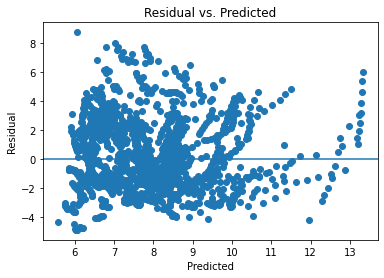

In [ ]:
plt.scatter(predictions, errors)
plt.xlabel('Predicted')
plt.ylabel('Residual')
plt.axhline(y=0)
plt.title('Residual vs. Predicted')
plt.show()

My error terms looks like homoscedastic. But let's make sure with Bartlett and Levene test

In [ ]:
from scipy.stats import bartlett
from scipy.stats import levene

bart_stats = bartlett(predictions, errors)
lev_stats = levene(predictions, errors)

print("Bartlett test statistic value is {0:3g} and p value is {1:.3g}".format(bart_stats[0], bart_stats[1]))
print("Levene test statistic value is {0:3g} and p value is {1:.3g}".format(lev_stats[0], lev_stats[1]))

Bartlett test statistic value is 612.092 and p value is 3.92e-135
Levene test statistic value is 460.643 and p value is 4.04e-96


The p-values of both tests are lower than 0.05. So, the test results reject the null hypothesis which means my errors are heteroscedastic. So my errors are defnitely homoscedastic which means distribution of my model's error terms (known as "scedasticity") is consistent for all predicted values.

We know that one of the assumption of Linear Regression is that error terms should be uncorrelated with one another. 

To identify whether the error terms are correlated with each other or not, we can graph them. In the graph, we need to observe randomness.

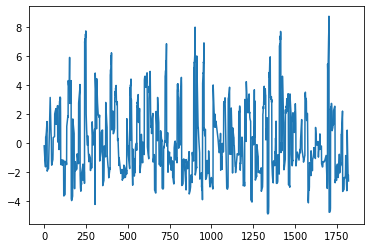

In [ ]:
plt.plot(errors)
plt.show()

We observe randomness from graph. It seems that the error terms of my model are uncorrelated with each other.

Another way to look at correlations between errors is to use the autocorrelation function. This function computes the correlation of a variable with itself.

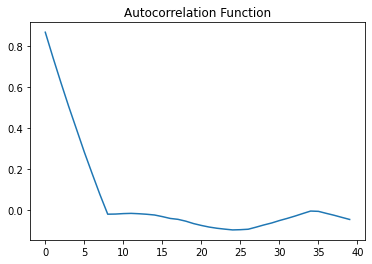

In [ ]:
from statsmodels.tsa.stattools import acf

acf_data = acf(errors)

plt.plot(acf_data[1:])
plt.title("Autocorrelation Function")
plt.show()

So, the autocorrelation between the errors of my model is very low 

In [ ]:
acf_data

array([ 1.        ,  0.86581625,  0.7408142 ,  0.62045383,  0.50372528,
        0.39283005,  0.28135991,  0.17678578,  0.07427466, -0.02163976,
       -0.02090978, -0.01872525, -0.01762454, -0.01938413, -0.02196441,
       -0.0255682 , -0.03336265, -0.0422574 , -0.04670183, -0.05560601,
       -0.06742552, -0.07651427, -0.08438235, -0.09019189, -0.09446816,
       -0.09829734, -0.09719914, -0.09497076, -0.08492712, -0.07416616,
       -0.06451529, -0.05264304, -0.04212156, -0.03070894, -0.01833587,
       -0.00630939, -0.00776499, -0.01749212, -0.02679095, -0.03715326,
       -0.04728499])

Let's check normality of error terms by visualizing the errors in a QQ plot or to look at the histogram 

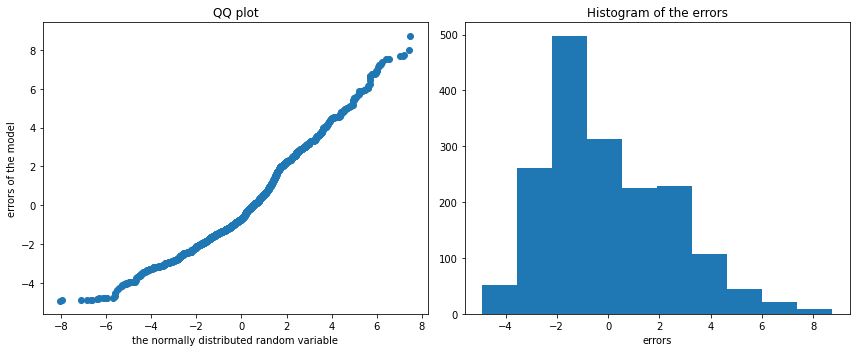

In [ ]:
rand_nums = np.random.normal(np.mean(errors), np.std(errors), len(errors))

plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.scatter(np.sort(rand_nums), np.sort(errors)) # we sort the arrays
plt.xlabel("the normally distributed random variable")
plt.ylabel("errors of the model")
plt.title("QQ plot")

plt.subplot(1,2,2)
plt.hist(errors)
plt.xlabel("errors")
plt.title("Histogram of the errors")

plt.tight_layout()
plt.show()

QQ plot and the histogram imply that the distribution is not very far away from normal.

Let's check it by using Jarque Bera and Normal tests and find out whether my error terms are normally distributed or not:

In [ ]:
from scipy.stats import jarque_bera
from scipy.stats import normaltest

In [ ]:
jb_stats = jarque_bera(errors)
norm_stats = normaltest(errors)

print("Jarque-Bera test statistics is {0} and p value is {1}".format(jb_stats[0], jb_stats[1]))
print("Normality test statistics is {0} and p value is {1}".format(norm_stats[0], norm_stats[1]))

Jarque-Bera test statistics is 128.35759618352898 and p value is 0.0
Normality test statistics is 108.36845629153244 and p value is 2.938249765116452e-24


The p-values of both tests indicate that our errors are not normally distributed.

Let's see cross validation score

In [ ]:
from sklearn.model_selection import cross_val_score
cross_val_score(lrm, X, Y, cv=5)

array([0.86867163, 0.68086525, 0.89881421, 0.78760658, 0.88043676])

In [ ]:
lrm_cv_array = cross_val_score(lrm, X, Y, cv=5)


Boxplot of cross validation scores;

{'boxes': [<matplotlib.lines.Line2D at 0x7fec04221208>],
 'caps': [<matplotlib.lines.Line2D at 0x7fec04221f60>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fec04246a20>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7fec042466a0>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7fec04221860>,
  <matplotlib.lines.Line2D at 0x7fec04221be0>]}

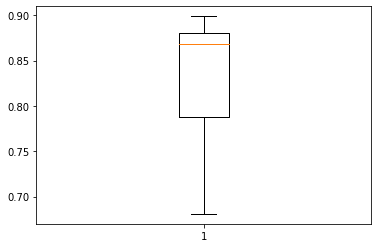

In [ ]:
plt.boxplot(lrm_cv_array)

In [ ]:
x = health_1[['sp_pop_65up_to_zs', 'sp_dyn_le00_ma_in', 'hs_sp_dyn_imrt_in']]
y = health_1.le_sp_dyn_cdrt_in
test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

In [ ]:
y_pred = lrm.predict(X_test)
y_pred

array([ 6.50852161, 11.10728342,  7.61366795,  9.70645536,  5.98830744,
        9.42883205,  4.60058752,  5.47602533,  9.78990557, 10.89684716,
        3.85605026,  4.64158393,  7.48797831, 10.31571838, 11.77022636,
        9.97557611,  9.7026731 ,  6.6593529 ,  6.0706363 , 11.34224153,
       10.7024409 ,  7.82181485,  6.69590905,  6.7347138 ,  5.46289867,
        6.59870033,  5.85091055,  7.64410616,  9.06604575,  8.81440797,
        8.97466605,  6.50603701,  6.48901862,  5.53108425,  5.73417169,
        6.8469889 ,  7.44467529, 10.5048099 ,  4.63978539,  6.69037745,
       10.94340967,  7.77131481, 11.12142277,  8.7683401 , 10.86579213,
        6.45713152,  7.8211164 ,  8.13489985,  8.76087829,  9.32664352,
        9.3099014 ,  0.56911356,  6.7250361 ,  6.63552963,  9.436844  ,
        0.52624902, 10.01304219,  4.58001831,  5.66359984,  3.68715452,
        7.02685975,  6.88547519,  8.17099734,  9.57935812,  9.20840086,
       10.52024987, 11.02845634,  8.53716376, 10.01444977,  4.12

In [ ]:
cv_score=cross_val_score(lrm, X, Y, cv=5)
print(cv_score.mean())
print(cv_score.std())

0.8232788849799993
0.08073074548232917


**DECISION TREE MODEL**

In [ ]:
from sklearn import tree
from sklearn.tree import DecisionTreeRegressor  
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score,mean_squared_error

from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn import ensemble

# A convenience for displaying visualizations.
from IPython.display import Image

# Packages for rendering our tree.
import pydotplus


In [ ]:
!pip install pydotplus

In [ ]:
x = health_1[['sp_pop_65up_to_zs', 'sp_dyn_le00_ma_in', 'hs_sp_dyn_imrt_in']]
y = health_1.le_sp_dyn_cdrt_in
test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.2, random_state = 465)

In [ ]:
# create a regressor object 
regressor = DecisionTreeRegressor(random_state = 0, max_depth=3, min_samples_leaf=5)  
  
# fit the regressor with X and Y data 
regressor.fit(X_train, y_train) 

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=3,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=5, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [ ]:
y_pred = regressor.predict(X_test)
y_pred

array([ 5.93014468,  8.87409302,  5.93014468,  8.04117568,  5.93014468,
        8.04117568,  5.93014468,  5.93014468,  8.87409302, 13.06425275,
        5.93014468,  5.93014468,  8.04117568, 10.27738333, 11.70840741,
        8.04117568,  8.87409302,  5.93014468,  5.93014468, 13.06425275,
       10.27738333,  8.04117568,  5.93014468,  5.93014468,  5.93014468,
        5.93014468,  5.93014468,  8.04117568,  8.04117568,  8.87409302,
        8.87409302,  5.93014468,  5.93014468,  5.93014468,  5.93014468,
        5.93014468,  5.93014468,  8.87409302,  5.93014468,  5.93014468,
        8.87409302,  5.93014468, 10.27738333,  8.87409302,  8.87409302,
        5.93014468,  5.93014468,  8.04117568,  8.87409302, 10.27738333,
        8.87409302,  5.93014468,  5.93014468,  5.93014468, 13.06425275,
        5.93014468,  5.93014468,  5.93014468,  5.93014468,  5.93014468,
        5.93014468,  5.93014468,  8.04117568,  8.04117568,  8.87409302,
        8.87409302, 10.27738333,  8.04117568,  8.87409302,  5.93

In [ ]:
regressor.score(X_test, y_test)

0.6099730088372637

Not satisfying test scores.

Just to check if I have a overfitting problem for the model, I run:

In [ ]:
regressor.score(X_train, y_train)

0.703435602602343

Difference between train and test results implies that, there might be overfitting problem.

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

1.6012430454307698

In [ ]:
cv_score=cross_val_score(regressor, X, Y, cv=5)
print(cv_score.mean())
print(cv_score.std())

0.5453938329060373
0.08858239943794223


In [ ]:
from sklearn.metrics import mean_absolute_error
mae = mean_absolute_error(y_test, y_pred)
mae

1.201748960347426

In [ ]:
from sklearn.tree import export_graphviz  
export_graphviz(regressor, out_file ='tree.dot', 
               feature_names =['sp_pop_65up_to_zs', 'sp_dyn_le00_ma_in', 'hs_sp_dyn_imrt_in'])  

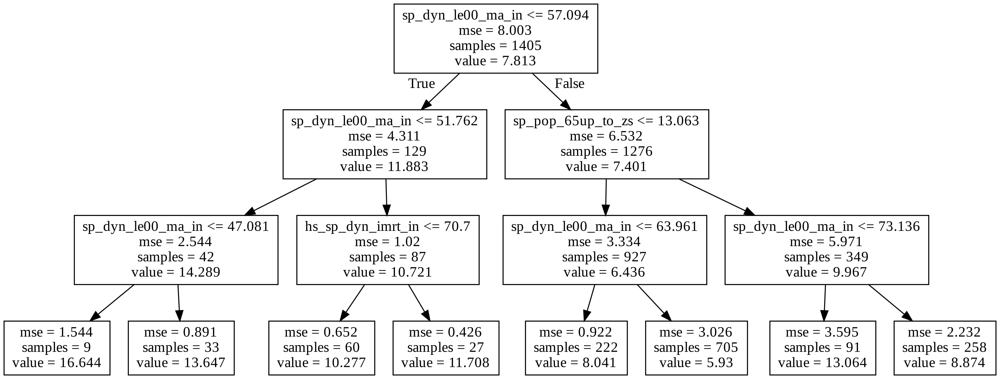

In [ ]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])
from IPython.display import Image
Image(filename='tree.png')

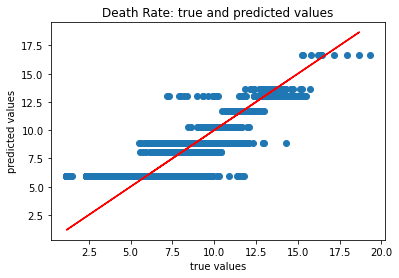

In [ ]:
plt.scatter(Y, regressor.predict(X))
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

In [ ]:
cross_val_score(regressor, X, Y, cv=5)

array([0.60435883, 0.37753292, 0.62585777, 0.54088263, 0.57833702])

In [ ]:
regressor_cv_array = cross_val_score(regressor, X, Y, cv=5)

Boxplot of cross validation scores;

{'boxes': [<matplotlib.lines.Line2D at 0x7fec0410b0f0>],
 'caps': [<matplotlib.lines.Line2D at 0x7fec0410bb00>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fec041145c0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7fec04114240>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7fec0410b400>,
  <matplotlib.lines.Line2D at 0x7fec0410b780>]}

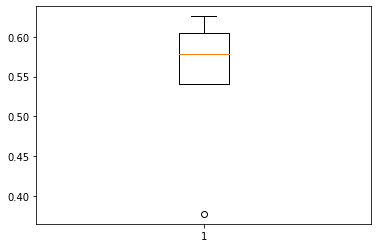

In [ ]:
plt.boxplot(regressor_cv_array)

**SUPPORT VECTOR MACHINE**

In [ ]:
from sklearn.svm import SVR
svr = SVR()
X = health_1[['sp_pop_65up_to_zs', 'sp_dyn_le00_ma_in', 'hs_sp_dyn_imrt_in']]
Y = health_1.le_sp_dyn_cdrt_in
svr.fit(X,Y)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

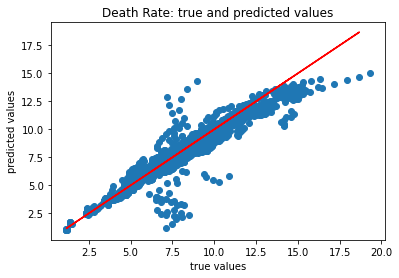

In [ ]:
plt.scatter(Y, svr.predict(X))
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

Let's check cross validation score to see how stable is my model.

In [ ]:
from sklearn.model_selection import cross_val_score
cross_val_score(svr, X, Y, cv=5)

array([0.88303873, 0.73433915, 0.90588154, 0.82448844, 0.91646492])

It's good that I have very high score of cross validation!

In [ ]:
svr_cv_array = cross_val_score(svr, X, Y, cv=5)

Boxplot of cross validation scores;

{'boxes': [<matplotlib.lines.Line2D at 0x7fec0404c400>],
 'caps': [<matplotlib.lines.Line2D at 0x7fec0404ce10>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fec040588d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7fec04058550>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7fec0404c710>,
  <matplotlib.lines.Line2D at 0x7fec0404ca90>]}

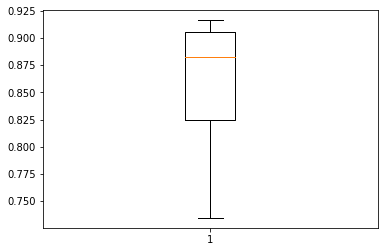

In [ ]:
plt.boxplot(svr_cv_array)

In [ ]:
x = health_1[['sp_pop_65up_to_zs', 'sp_dyn_le00_ma_in', 'hs_sp_dyn_imrt_in']]
y = health_1.le_sp_dyn_cdrt_in
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, random_state=42)

In [ ]:
svr.fit(x_train, y_train)

SVR(C=1.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)

In [ ]:
svr.score(x_test, y_test)

0.8466001414996924

In [ ]:
svr.score(x_train, y_train)

0.8753200745936116

Not too much difference between test and training scores. So, no overfitting

In [ ]:
y_pred = svr.predict(x_test)
y_pred

array([ 9.04091592,  5.54975851, 10.35351294,  7.31964928,  5.54753502,
        7.36802841,  5.38561326,  7.89463088,  9.60531892,  6.9640405 ,
        8.71667993, 12.72780232,  5.19398658, 12.43317934,  6.25502621,
       11.78749128,  9.78023191,  7.52407975, 11.78198212,  6.87024333,
        2.62766683,  8.11658978,  6.6648862 , 11.30082637,  5.21599197,
        5.5804491 ,  2.6279835 ,  4.48694753,  7.72153645,  7.34020392,
        6.2127402 ,  6.30683434,  8.03931844,  8.17876023,  5.293914  ,
       10.16041095, 10.73867469,  2.54835504,  7.4080325 , 13.08344643,
        2.87948688,  7.77121727,  6.51696766, 10.47551042,  3.64590402,
        3.25394472,  3.68661214,  9.72037491,  3.71062248,  7.04431797,
        6.96665406,  6.72916852,  7.13577476,  5.72139708, 11.04011102,
        7.56086466,  7.73064753,  6.26166384, 10.8641811 , 10.1197265 ,
        4.20277529,  7.01635706, 11.08132098, 10.90245458,  5.15083624,
        8.54610276,  7.11431947,  9.43564181,  6.18250215, 11.31

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

1.093630973784036

In [ ]:
from sklearn.metrics import mean_absolute_error

In [ ]:
mae = mean_absolute_error(y_test, y_pred)
mae

0.6698704961785643

In [ ]:
cv_score=cross_val_score(svr, X, Y, cv=5)
print(cv_score.mean())
print(cv_score.std())

0.8528425567751767
0.06726033294751366


**GRADIENT BOOSTING**

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor
est = GradientBoostingRegressor()

In [ ]:
est.fit(x_train, y_train)

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=3,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [ ]:
est.score(x_test, y_test)

0.911172867754418

Looking at the sampling of individual model score , these are certainly 'strong learners'! They perform very good. Yet in aggregate, the models are able to explain nearly 91% of the variance in death rate in the dataset.

In [ ]:
est.score(x_train, y_train)

0.9656194231982591

Not big difference between train and test scores which implies no overfitting problem.

In [ ]:
cv_score=cross_val_score(est, X, Y, cv=5)
print(cv_score.mean())
print(cv_score.std())

0.8564298776254183
0.07452493746513181


In [ ]:
cv_score

array([0.93591573, 0.71780899, 0.88807259, 0.84947695, 0.89087513])

In [ ]:
est_cv_array = cross_val_score(est, X, Y, cv=5)

Boxplot of cross validation scores;

{'boxes': [<matplotlib.lines.Line2D at 0x7fec03fd0400>],
 'caps': [<matplotlib.lines.Line2D at 0x7fec03fd0e10>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fec03fdc8d0>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7fec03fdc550>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7fec03fd0710>,
  <matplotlib.lines.Line2D at 0x7fec03fd0a90>]}

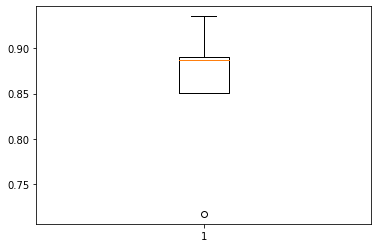

In [ ]:
plt.boxplot(est_cv_array)

Let's check cross validation score to see how stable is my model.

In [ ]:
y_pred = est.predict(x_test)
y_pred

array([ 8.73263221,  5.58389304, 10.76545724,  7.24838051,  5.56550454,
        7.53494239,  5.24075065,  7.18124668, 10.10447839,  7.09493273,
        9.54856288, 14.69353073,  5.64105451, 13.64006753,  6.41520884,
       12.10415006,  9.55815879,  7.67483003, 12.83173094,  7.14902673,
        2.17193938,  8.04589165,  6.48730615, 10.35238169,  5.45499257,
        5.02828036,  6.07588365,  4.45825376,  7.63880003,  7.513549  ,
        6.15936612,  6.66567952,  7.97091506,  8.38021431,  5.44274384,
       10.70464135, 11.0126175 ,  2.44353638,  7.69191382, 13.60472168,
        2.44247799,  8.1604299 ,  6.52996369,  9.51949886,  4.39667213,
        3.27846827,  3.49570672,  9.92564751,  3.4756913 ,  6.8314603 ,
        7.11778889,  6.57036167,  7.57993684,  5.85675259, 12.23860757,
        7.03675034,  7.7813068 ,  5.76413246, 13.04143784, 10.70464135,
        5.12683564,  6.68396796, 12.57853608, 10.81161996,  5.39396985,
        8.61274039,  6.95556365, 10.42379156,  6.03516735, 13.69

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

0.832206575483828

In [ ]:
mae = mean_absolute_error(y_test, y_pred)
mae

0.5154143816393576

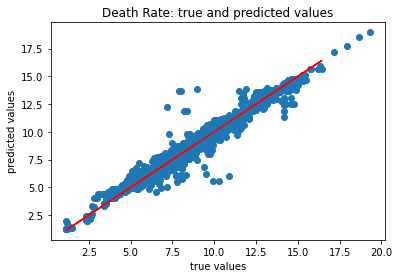

In [ ]:
plt.scatter(Y, est.predict(X))
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

**RANDOM FOREST MODEL**

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rfc = ensemble.RandomForestRegressor()

In [ ]:
rfc.fit(x_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
rfc.score(x_test, y_test)

0.9259311498592636

In [ ]:
rfc.score(x_train, y_train)

0.993375369518932

It's not a big difference but still difference with test and training results which may imply overfitting risk for model as in usual in Random Forest models.

Let's check cross validation score to see how stable is my model

First Attempt (cv=5)

In [ ]:
rfc = ensemble.RandomForestRegressor()
cross_val_score(rfc, X, Y, cv=5)

array([0.91439375, 0.71726804, 0.87979352, 0.85534919, 0.8952796 ])

In [ ]:
rfc_cv_array = cross_val_score(rfc, X, Y, cv=5)

Boxplot of cross validation scores;

{'boxes': [<matplotlib.lines.Line2D at 0x7fec03f2a2e8>],
 'caps': [<matplotlib.lines.Line2D at 0x7fec03f2acf8>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fec03f367b8>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7fec03f36438>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7fec03f2a5f8>,
  <matplotlib.lines.Line2D at 0x7fec03f2a978>]}

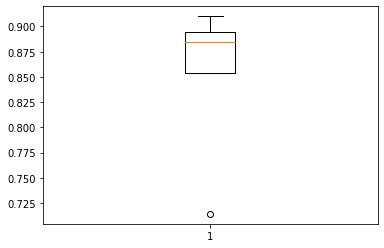

In [ ]:
plt.boxplot(rfc_cv_array)

Second Attempt (cv=10)

In [ ]:
rfc = ensemble.RandomForestRegressor()

cross_val_score(rfc, X, Y, cv=10)

array([0.90505172, 0.93522647, 0.66833705, 0.76447245, 0.93576424,
       0.87709913, 0.82751793, 0.86120811, 0.9084685 , 0.89547801])

In [ ]:
rfc_cv_array = cross_val_score(svr, X, Y, cv=5)

{'boxes': [<matplotlib.lines.Line2D at 0x7fec03e74048>],
 'caps': [<matplotlib.lines.Line2D at 0x7fec03e74a20>,
 'fliers': [<matplotlib.lines.Line2D at 0x7fec03e7f4a8>],
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7fec03e7f160>],
 'whiskers': [<matplotlib.lines.Line2D at 0x7fec03e74358>,
  <matplotlib.lines.Line2D at 0x7fec03e746a0>]}

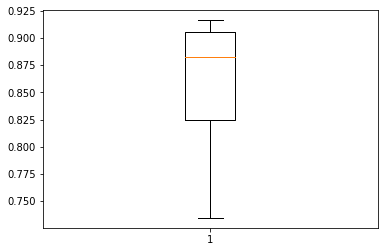

In [ ]:
plt.boxplot(rfc_cv_array)

First attempt reveals better results while cv=5. So take first attempt into consideration.

In [ ]:
cv_score=cross_val_score(rfc, X, Y, cv=5)
print(cv_score.mean())
print(cv_score.std())

0.8520197787036443
0.07459939151646794


In [ ]:
rfc.fit(x_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
y_pred = rfc.predict(x_test)
y_pred

array([ 8.961  ,  5.54838, 10.8983 ,  6.95642,  5.31761,  7.32618,
        4.99975,  7.77875,  9.85395,  6.6013 ,  9.21327, 14.938  ,
        5.09957, 13.72752,  6.31029, 12.33677,  9.306  ,  7.08406,
       13.10093,  6.80174,  2.35177,  8.65225,  6.60247,  9.57393,
        5.17786,  5.09188,  7.11815,  4.34961,  7.17054,  7.39453,
        6.31494,  6.97071,  7.96499,  8.84291,  5.039  , 10.68877,
       11.19851,  2.32084,  7.88767, 13.45231,  2.61184,  7.90471,
        6.37542, 10.28   ,  3.79628,  3.15721,  3.42217,  9.97055,
        3.41815,  6.91732,  6.679  ,  7.20181,  7.19306,  6.16276,
       12.59431,  7.23188,  8.64821,  5.87084, 13.22185, 10.70939,
        4.76217,  6.87245, 12.903  , 11.14743,  5.64777,  8.91193,
        6.78202, 10.50088,  5.75217, 13.396  , 13.98162,  7.22005,
        8.999  ,  9.73243, 13.835  ,  2.36637, 11.32892,  9.77904,
        6.21143,  5.34126,  5.66165,  8.905  ,  4.49649,  7.21905,
        5.33229, 14.37542,  7.63354,  5.03162,  7.54328, 11.26

In [ ]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmse

0.7712406130990267

In [ ]:
mae = mean_absolute_error(y_test, y_pred)
mae

0.4091784532821971

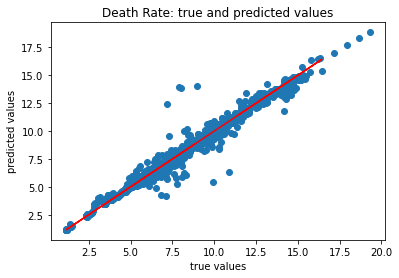

In [ ]:
plt.scatter(Y, rfc.predict(X))
plt.plot(y_test, y_test, color="red")
plt.xlabel("true values")
plt.ylabel("predicted values")
plt.title("Death Rate: true and predicted values")
plt.show()

**MODEL COMPARISON**

Let's compare all model's cross validation scores as a plotbox.  

Text(0.5, 1.0, 'Comparing Cross Validation Scores')

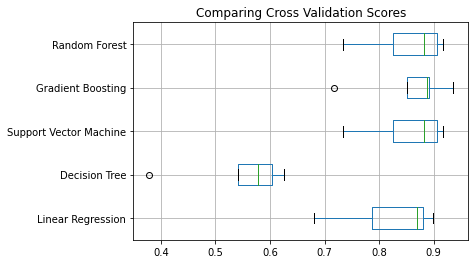

In [ ]:
d = {'Linear Regression': lrm_cv_array,  'Decision Tree': regressor_cv_array, 
     'Support Vector Machine': svr_cv_array, 'Gradient Boosting': est_cv_array, 'Random Forest': rfc_cv_array} 
df =pd.DataFrame(data=d)
df.plot.box(grid=True, vert=False)
plt.title('Comparing Cross Validation Scores')

As a conclusion;

I have 5 different scores to compare the models, which are;

-R score

-Root Mean Squared Error

-Mean Absolute Error

-Cross validation Score Mean

-Cross Validation Score Standart Deviation

Each model may have some pros and cons. However, based on above selected scores and analysis run accordingly, Random Forest model is the best performing model to explain Death Rate. It outcompeted other models in almost each selected scores.

The predictive performance of Random Forest Model is always on top and it also provides a reliable feature importance estimate.

What might be the weakness of Random Forest Model?

Random Forest Model is less interpretable than a individual decision tree and the predictions are slower.

[Please see link below for model comparison table.]

(https://github.com/mozkemah/Health-Nutrition-Population/blob/master/Model%20Comparison%20table.png)

Thank you.

Mehmet Ozkemah